## Pixel explanations for a deep neural network diabetic retinopathy classification model



Let's import some libraries required for the notebook to work:

In [1]:
import random
import os

import torch 
import torch.nn as nn 
import torch.nn.functional as F 
import torchvision.transforms as transforms 
import torchvision.datasets as datasets 
 
import numpy as np 
 
import quadratic_weighted_kappa as qwk 
import transforms_extra 
import models 

import matplotlib
import matplotlib.pyplot as plt

import math

%matplotlib inline 

import visualization_rev1 as vis

Let's define some constants related with the model:

In [2]:
workers = 4
batch_size = 1
mean = [0.383, 0.266, 0.190]
std = [0.291, 0.211, 0.171]
normvect = [-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]]
input_size = 640
input_channels = 3
# number of rotated configurations
configurations = 5
hidden_features = 64

And now, let's load the test dataset:

In [3]:
# Data loading code                                                         
testdir = '../input/640_itaka'
normalize = transforms.Normalize(mean=mean, std=std)                                                                                  
dataset_test = datasets.ImageFolder(testdir, transforms.Compose([                                        
    transforms.Scale(input_size),                                                                                    
    transforms.ToTensor(),                                              
    normalize,
    transforms_extra.CenteredCircularMaskTensor(input_size, normvect),
]))


/home/jordi/anaconda3/lib/python3.6/site-packages/torchvision-0.2.0-py3.6.egg/torchvision/transforms/transforms.py:156: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.


Let's load the previously trained model:

In [4]:
# load the model
resume = 'models/ret6_bn/model_best-QWKval0814.pth.tar'
print("=> loading checkpoint '{}'".format(resume))
checkpoint = torch.load(resume)
start_epoch = checkpoint['epoch']
best_prec1 = checkpoint['best_prec1']
import models
model = models.ret6_bn()
model.load_state_dict(checkpoint['state_dict'])
print("=> loaded checkpoint '{}' (epoch {})".format(resume, checkpoint['epoch']))

=> loading checkpoint 'models/ret6_bn/model_best-QWKval0814.pth.tar'
=> loaded checkpoint 'models/ret6_bn/model_best-QWKval0814.pth.tar' (epoch 638)


We instantiate the previously defined model with the parameters of the pretrained one loaded before:

In [5]:
me = models.model_explainable(model)
#me = me.cuda()
me = me.cpu()
me.eval()

model_explainable(
  (rf3): Sequential(
    (0): Conv2d (3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
  )
  (rf5): Sequential(
    (0): Conv2d (16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
  )
  (rf9): Sequential(
    (0): Conv2d (16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
  )
  (rf13): Sequential(
    (0): Conv2d (32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
  )
  (rf21): Sequential(
    (0): Conv2d (32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
  )
  (rf29): Sequential(
    (0): Conv2d (64, 64

Now, we load a image from the dataset. This image is the one that will be analyzed:

In [6]:
dataset = dataset_test

#image_nr = 9857
image_nr = 9

#image_nr = int(len(dataset.imgs)*random.random())

batch = torch.zeros(1, input_channels, input_size, input_size)
target = torch.zeros(1).long()

img, img_target = dataset.__getitem__(image_nr)
path, _ = dataset.imgs[image_nr]
file = os.path.basename(path)

batch[0].copy_(img)

if next(me.parameters()).is_cuda:
    batch = batch.cuda()

input = torch.autograd.Variable(batch, volatile=True)
target[0] = img_target

Let's visualize the image:

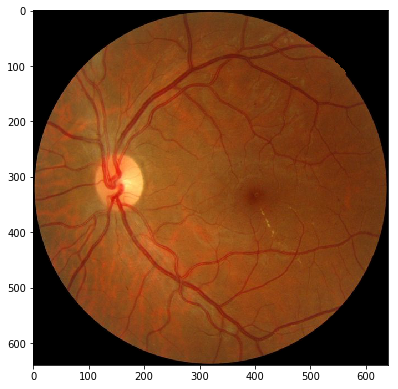

In [7]:
input_rgb = batch.clone()
#print(input_rgb.size())
for i in range(3):
    input_rgb[0][i].mul_(std[i])
    input_rgb[0][i].add_(mean[i])

input_rgb[torch.lt(input_rgb, 0)] = 0.0
input_rgb[torch.gt(input_rgb, 1)] = 1.0

vis.plot(input_rgb)

#del input_rgb

Let's calculate with the model the predicted classification class.
We also calculate the intermediate values of the activations of every layer

In [8]:
#output, features, rf637, rf509_p, rf381, \
#rf253_p, rf189, rf125_p, rf93, rf61_p, rf45, \
#rf29_p, rf21, rf13_p, rf9, rf5_p, rf3
layer_vals = me.forward(input)
layer = 17
output = layer_vals[layer]

print("Image nr:" + str(image_nr))
print('File: ' + dataset.imgs[image_nr][0])
imagename = os.path.splitext(os.path.basename(dataset.imgs[image_nr][0]))[0]
print("Image name: " + imagename)
print("Tag")
print('Output before softmax: ')
print(output)
prob_pred_class, pred_class = output.max(1)
pred_class = pred_class[0]
print("Predicted class: " + str(pred_class))
print('Target: ')
print(target)


Image nr:9
File: ../input/640_itaka/itaka/0NGPP8431Y6KYVMJ_OS_ND.jpeg
Image name: 0NGPP8431Y6KYVMJ_OS_ND
Tag
Output before softmax: 
Variable containing:
-295.0830  -30.9120   21.7021  -34.7909 -194.4052
[torch.FloatTensor of size 1x5]

Predicted class: Variable containing:
 2
[torch.LongTensor of size 1]

Target: 

 0
[torch.LongTensor of size 1]



## Last layer feature activations
And now we plot the feature activations in the last layer of the model previous to the output layer:

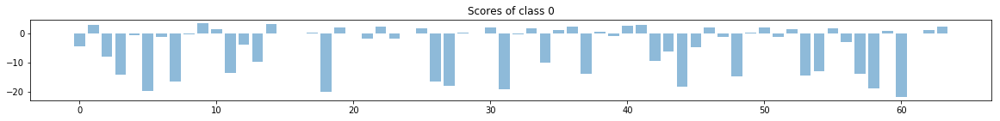

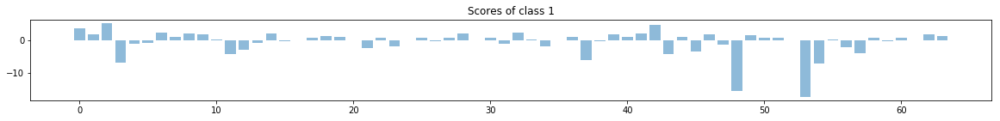

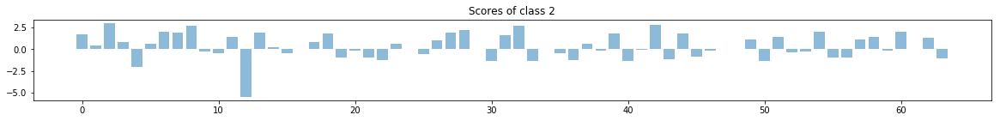

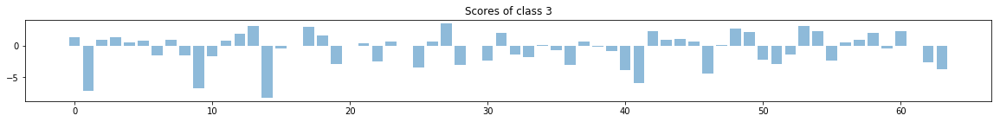

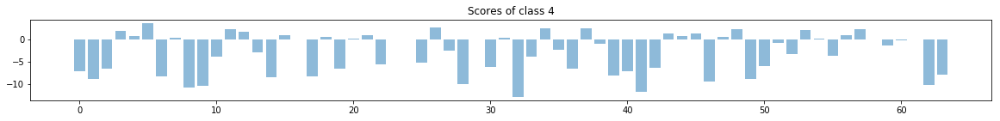

In [9]:
layer = 16
features = layer_vals[layer]
score_features = torch.mul(me.lc[0].weight, features.expand(5,64))
objects = [str(i) for i in range(64)]
y_pos = np.arange(len(objects))

for i in range(5):
    feat = score_features.data[i].tolist()
    fig = plt.figure(figsize=(20,10))
    fig.add_subplot(5, 1, i+1)
    plt.bar(y_pos, feat, align='center', alpha=0.5)
    plt.title('Scores of class {}'.format(i))
#plt.xticks(y_pos, objects)
#plt.ylabel('f')

plt.show()

We create a variable to sum the constants contributions of every layer mapped into the input space. Finally we will add this value to the values calculated for the input space

In [10]:
score_accumulated_k = torch.autograd.Variable(torch.zeros(5, 1, input_size, input_size), volatile=True)

## Score propagation through average pooling layer:


In [11]:
layer = 15
rf637 = layer_vals[layer]
score_rf637 = me.lc[0].weight.unsqueeze(2).unsqueeze(3).expand(5,64,4,4) * rf637.expand(5,64,4,4) / 16
vis.stats(score_rf637)

Max: 0.7375839352607727, Min: -3.928438186645508, Avg: -0.10426702530657224, Std:0.4164113856429738
torch.Size([5, 64, 4, 4])


(0.7375839352607727,
 -3.928438186645508,
 -0.10426702530657224,
 0.4164113856429738)

## Scores of the individual feature maps of the 15th layer

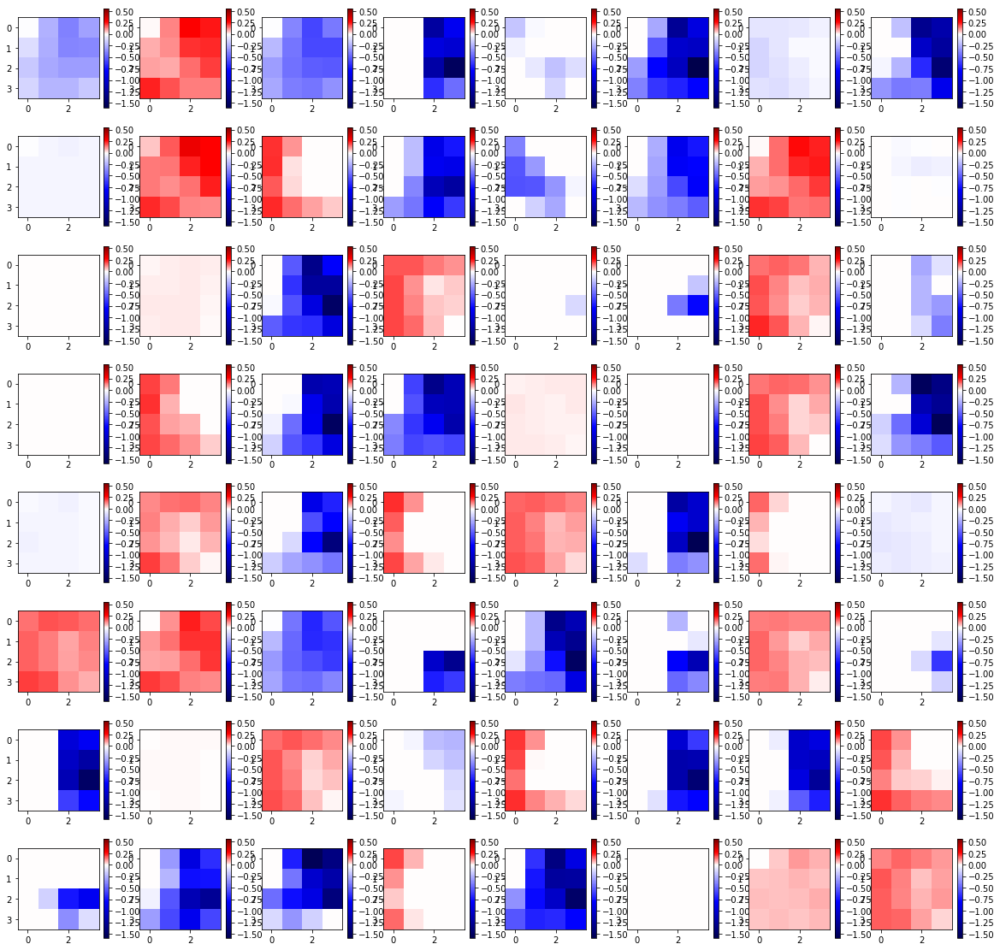

In [12]:
vis.plot_scores(img_target,score_rf637)

## Aggregate feature maps scores of the 15th layer

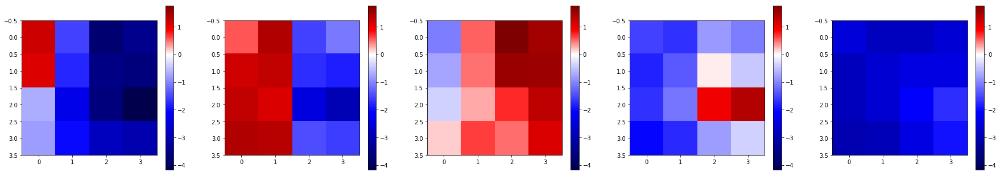

In [13]:
#vis.plot_scores(img_target,score_rf637.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf637.sum(1).unsqueeze(0), figsize=(50,50))


## Aggregated scores of 15th layer mapped into pixel space using a 2d-normal 2std=rf prior

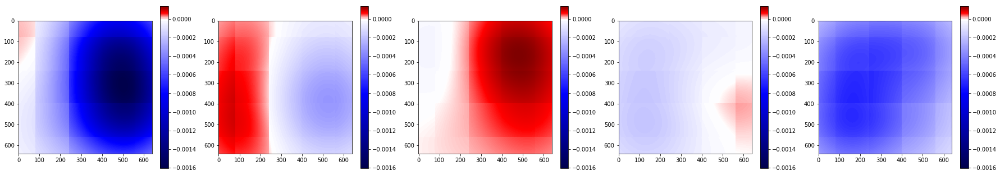

Variable containing:
-533.8472
[torch.FloatTensor of size 1]



In [14]:
tmp = vis.map_scores_to_input_sz(score_rf637.sum(1).unsqueeze(1), 637)
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
#vis.plot_scores(img_target,tmp, figsize=(50,50))
print(tmp.view(-1).sum())
del tmp

## Score propagation through classification layer (2x2 convolution)


In [15]:
layer = 14
rf509_p = layer_vals[layer]
rf509, mp_idx = F.max_pool2d(rf509_p, 2, 2, return_indices = True)  # 1x64x5x5
score_rf509, score_k637 = vis.propagate_score_through_conv2d_sz2_pad0(score_rf637, rf509, rf637, me.rf637)
#del val, rf509_p
vis.stats(score_rf509)

Max: 7.192414283752441, Min: -11.626453399658203, Avg: -0.09069047372631675, Std:0.7450446762413168
torch.Size([5, 64, 5, 5])


(7.192414283752441,
 -11.626453399658203,
 -0.09069047372631675,
 0.7450446762413168)

torch.Size([5, 1, 4, 4])


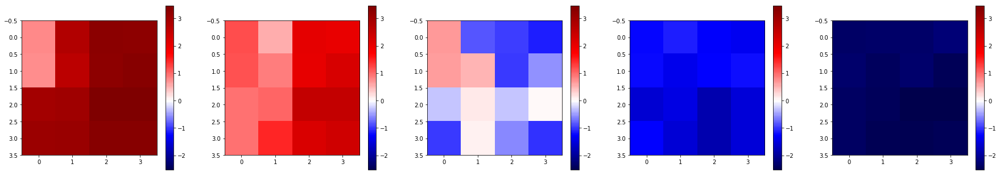

In [16]:
# sum of constant scores of the layer
score_k637 = score_k637.sum(1).unsqueeze(1)
print(score_k637.size())
vis.plot_scores(0,score_k637.sum(1).unsqueeze(0), figsize=(50,50))
#vis.plot_scores(img_target,score_k637, figsize=(50,50))

In the previous map, every pixel corresponds to a receptive field. There is superposition between the activations showed in the above map. We now from bibliography that the receptive fields have a nearly gaussian detection capability. Considering a 2 stdev gaussian model over the receptive field, we can map the activations to input space. The result is shown below:

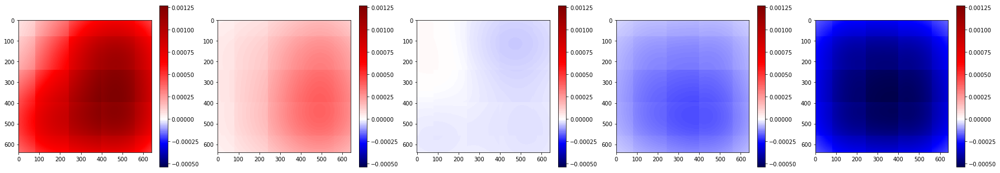

Max: 0.0012693775352090597, Min: -0.0005376714398153126, Avg: 9.359206684278862e-05, Std:0.0004256944493931067
torch.Size([5, 1, 640, 640])
Variable containing:
 191.6765
[torch.FloatTensor of size 1]

Variable containing:
 191.6766
[torch.FloatTensor of size 1]



In [17]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k637, 637)
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
print(score_k637.sum())
print(score_kmapped.sum())
#del score_k637

## Scores of the feature maps of the 14th layer

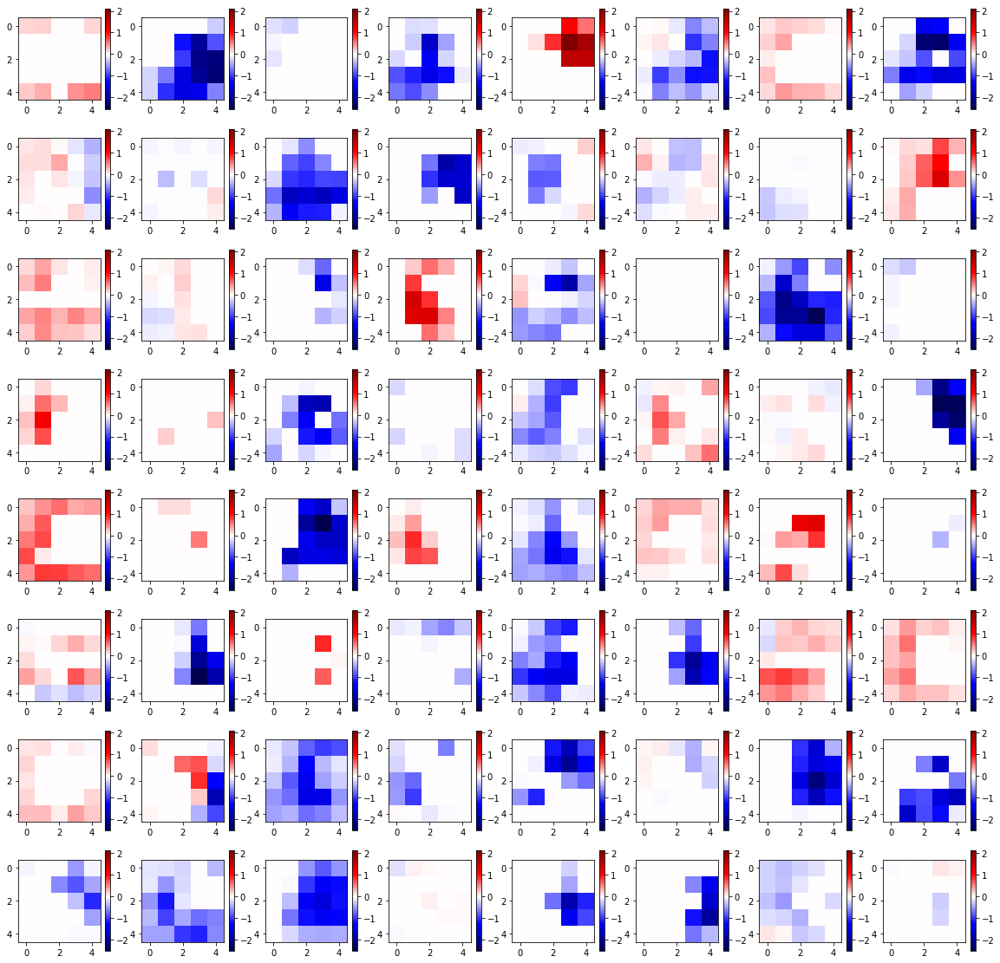

In [18]:
vis.plot_scores(img_target,score_rf509)

## Aggregated feature map scores of the 14th layer

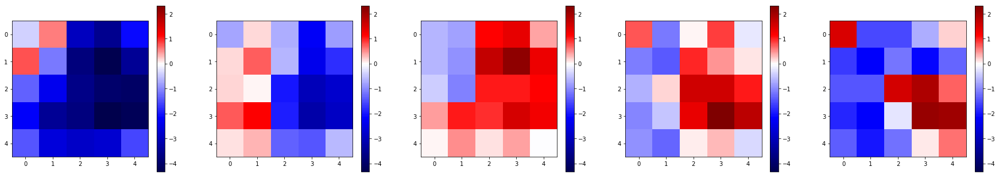

In [19]:
#vis.plot_scores(img_target,score_rf509.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf509.sum(1).unsqueeze(0), figsize=(50,50))


## Aggregated feature map scores of the 14th layer mapped into input space

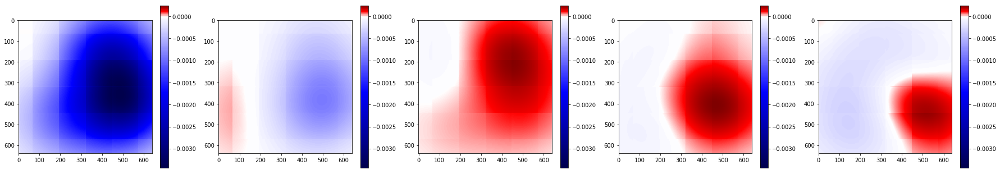

In [20]:
tmp = vis.map_scores_to_input_sz(score_rf509.sum(1).unsqueeze(1), 509)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [21]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf509, mp_idx)
#del score_rf509, mp_idx
layer = 13
rf381 = layer_vals[layer]
score_rf381, score_k509 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf381, rf509_p, me.rf509)
#del score_mp, rf381
vis.stats(score_rf381)
vis.stats(score_k509)

Max: 8.579278945922852, Min: -13.765203475952148, Avg: -0.00916567132930409, Std:0.3303136898627218
torch.Size([5, 64, 10, 10])
Max: 4.873049736022949, Min: -12.371910095214844, Avg: -0.013506946533825349, Std:0.34287225469358645
torch.Size([5, 64, 10, 10])


(4.873049736022949,
 -12.371910095214844,
 -0.013506946533825349,
 0.34287225469358645)

torch.Size([5, 1, 10, 10])


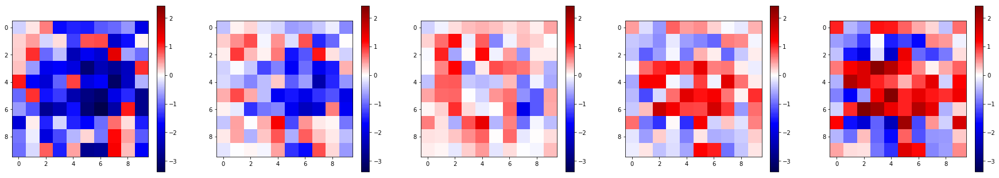

In [22]:
score_k509 = score_k509.sum(1).unsqueeze(1)
print(score_k509.size())
#vis.plot_scores(img_target, score_k509, figsize=(50,50))
vis.plot_scores(0,score_k509.sum(1).unsqueeze(0), figsize=(50,50))

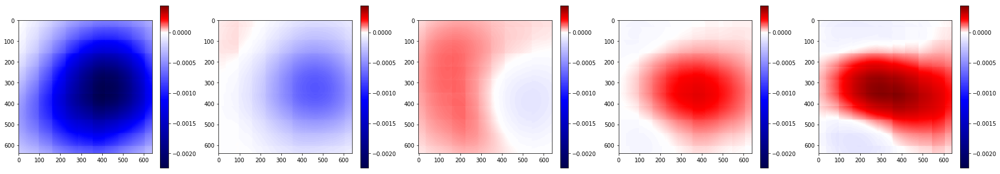

Max: 0.0004405742511153221, Min: -0.0022416713181883097, Avg: -0.00021104603988541626, Std:0.0005110064514280787
torch.Size([5, 1, 640, 640])
Variable containing:
-432.2223
[torch.FloatTensor of size 1]

Variable containing:
-432.2223
[torch.FloatTensor of size 1]



In [23]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k509, 509)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k509
print(score_k509.sum())
print(score_kmapped.sum())

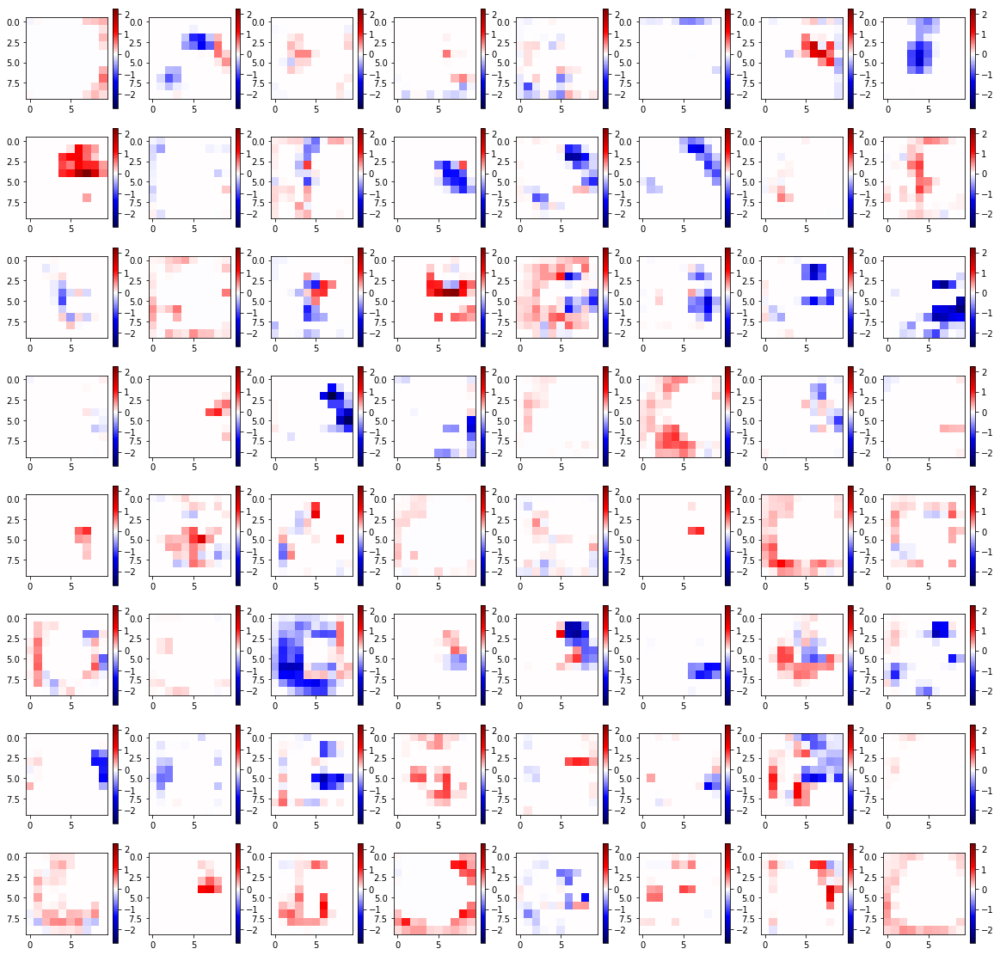

In [24]:
vis.plot_scores(img_target, score_rf381)

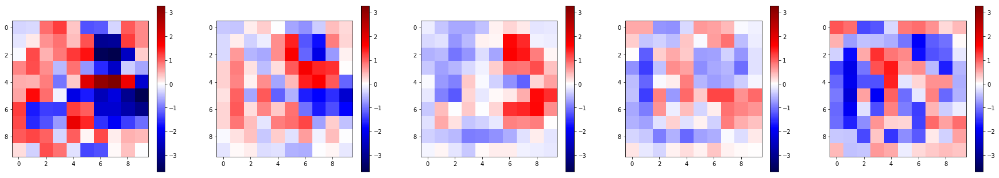

In [25]:
#vis.plot_scores(img_target,score_rf381.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf381.sum(1).unsqueeze(0), figsize=(50,50))

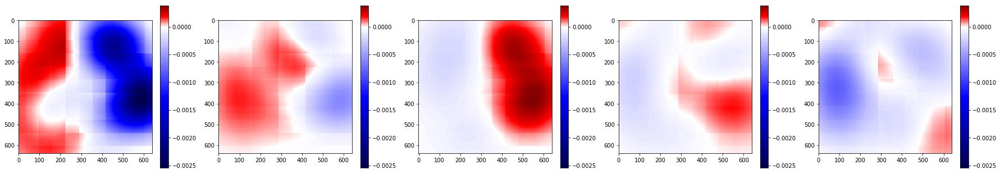

In [26]:
tmp = vis.map_scores_to_input_sz(score_rf381.sum(1).unsqueeze(1), 381)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [27]:
layer = 12
rf253_p = layer_vals[layer]
rf253, mp_idx = F.max_pool2d(rf253_p, 2, 2, return_indices = True)  # 1x64x5x5
#del rf253_p
score_rf253, score_k381 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf381, rf253, rf381, me.rf381)
#del score_rf381, val
vis.stats(score_rf253)

Max: 6.048281192779541, Min: -10.601263999938965, Avg: -0.01247961365675718, Std:0.3564674965790147
torch.Size([5, 64, 10, 10])


(6.048281192779541,
 -10.601263999938965,
 -0.01247961365675718,
 0.3564674965790147)

torch.Size([5, 1, 10, 10])


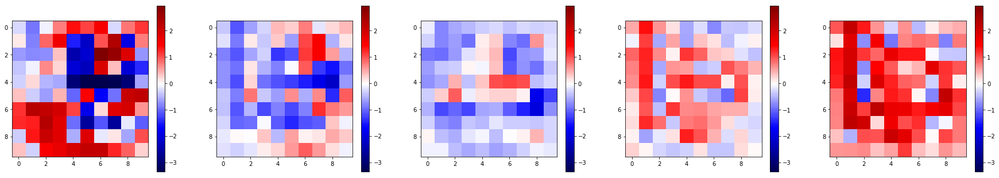

In [28]:
score_k381 = score_k381.sum(1).unsqueeze(1)
print(score_k381.size())
#vis.plot_scores(img_target, score_k381, figsize=(50,50))
vis.plot_scores(0,score_k381.sum(1).unsqueeze(0), figsize=(50,50))

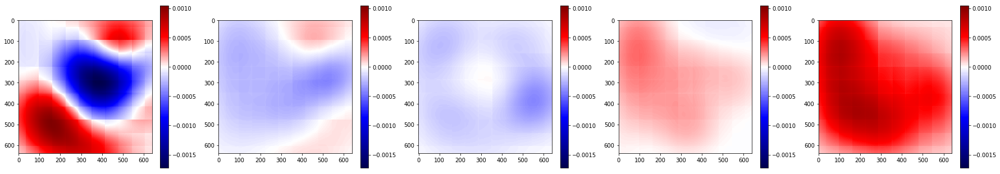

Max: 0.001045812969096005, Min: -0.0017293045530095696, Avg: 5.1780344940250715e-05, Std:0.0003852398233642034
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
 -7.0628e-08 -2.2161e-07 -3.7100e-07  ...   2.6190e-04  2.6050e-04  2.5910e-04
 -2.3048e-07 -3.8381e-07 -5.3554e-07  ...   2.6334e-04  2.6193e-04  2.6052e-04
 -3.8986e-07 -5.4555e-07 -6.9959e-07  ...   2.6477e-04  2.6335e-04  2.6193e-04
                 ...                   ⋱                   ...                
  2.5925e-04  2.6123e-04  2.6322e-04  ...   2.6983e-04  2.6839e-04  2.6694e-04
  2.5802e-04  2.5999e-04  2.6196e-04  ...   2.6942e-04  2.6797e-04  2.6652e-04
  2.5678e-04  2.5874e-04  2.6070e-04  ...   2.6898e-04  2.6754e-04  2.6609e-04
      ⋮  

( 1 , 0 ,.,.) = 
 -5.2021e-05 -5.2635e-05 -5.3247e-05  ...   7.2345e-05  7.1930e-05  7.1517e-05
 -5.2440e-05 -5.3058e-05 -5.3675e-05  ...   7.2704e-05  7.2287e-05  7.1870e-05
 -5.2856e-05 -5.3479e-05 -5.4100e-05  ...   7.3062e-05  7.2641e-05  7.2222e-05
                 ...                   ⋱                   ...                
 -4.5717e-06 -4.6775e-06 -4.7825e-06  ...   1.2130e-04  1.2061e-0

In [29]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k381, 381)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k381

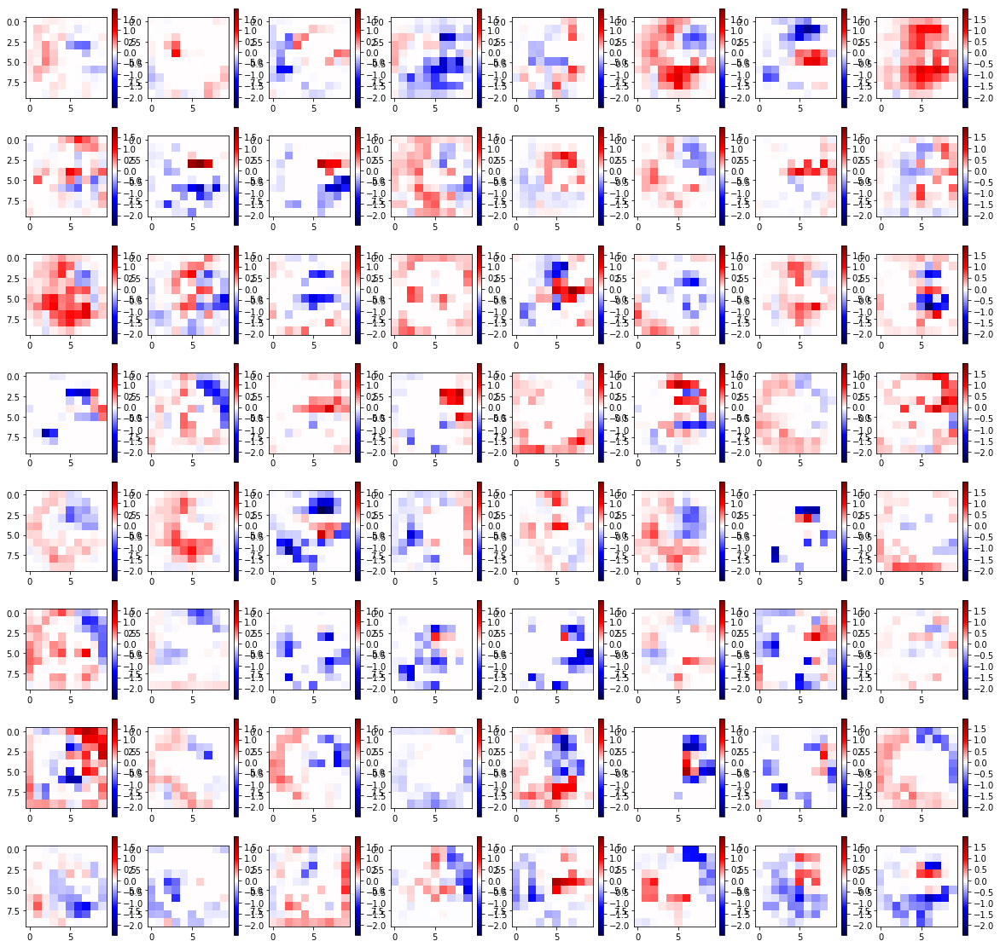

In [30]:
vis.plot_scores(img_target,score_rf253)

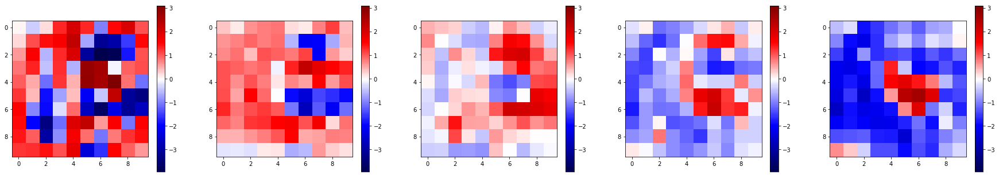

In [31]:
#vis.plot_scores(img_target,score_rf253.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf253.sum(1).unsqueeze(0), figsize=(50,50))

In [32]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf253, mp_idx)
#del score_rf253, mp_idx
layer = 11
rf189 = layer_vals[layer]
score_rf189, score_k253 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf189, rf253_p, me.rf253)
#del score_mp, rf189
vis.stats(score_rf189)

Max: 3.724321126937866, Min: -10.100293159484863, Avg: -0.0023518543531802437, Std:0.14117794796852035
torch.Size([5, 64, 20, 20])


(3.724321126937866,
 -10.100293159484863,
 -0.0023518543531802437,
 0.14117794796852035)

torch.Size([5, 1, 20, 20])


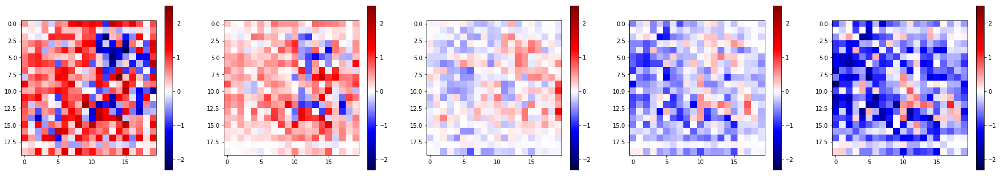

In [33]:
score_k253 = score_k253.sum(1).unsqueeze(1)
print(score_k253.size())
#vis.plot_scores(img_target, score_k253, figsize=(50,50))
vis.plot_scores(0,score_k253.sum(1).unsqueeze(0), figsize=(50,50))

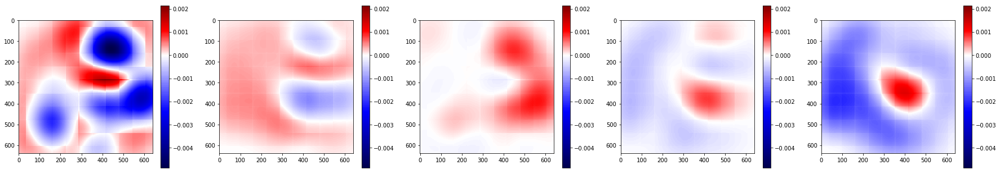

In [34]:
#print(score_rf253.view(-1).sum()) # score conservation through mapping to input space test
tmp = vis.map_scores_to_input_sz(score_rf253.sum(1).unsqueeze(1), 253)
#print(tmp.view(-1).sum()) # score conservation through mapping to input space test (2)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

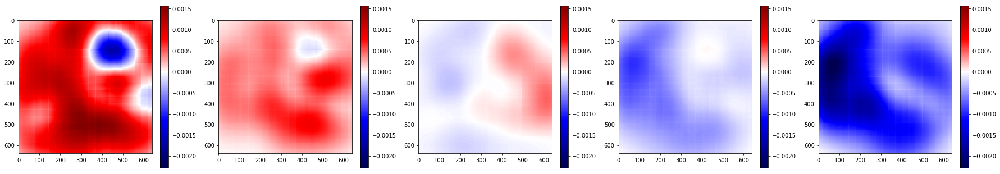

Max: 0.001568778301589191, Min: -0.002292977413162589, Avg: -4.800305450566092e-05, Std:0.0006753403149404974
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  1.3734e-04  1.3836e-04  1.3936e-04  ...   7.1285e-04  7.0750e-04  7.0211e-04
  1.3856e-04  1.3959e-04  1.4061e-04  ...   7.1891e-04  7.1351e-04  7.0808e-04
  1.3978e-04  1.4082e-04  1.4185e-04  ...   7.2492e-04  7.1949e-04  7.1401e-04
                 ...                   ⋱                   ...                
  5.2636e-04  5.3145e-04  5.3654e-04  ...   5.8783e-04  5.8389e-04  5.7990e-04
  5.2224e-04  5.2729e-04  5.3234e-04  ...   5.8364e-04  5.7972e-04  5.7576e-04
  5.1809e-04  5.2311e-04  5.2811e-04  ...   5.7942e-04  5.7553e-04  5.7159e-04
      ⋮  

( 1 , 0 ,.,.) = 
  8.5984e-06  8.4377e-06  8.2700e-06  ...   2.0931e-04  2.0750e-04  2.0569e-04
  8.7067e-06  8.5455e-06  8.3772e-06  ...   2.1092e-04  2.0910e-04  2.0727e-04
  8.8121e-06  8.6503e-06  8.4815e-06  ...   2.1252e-04  2.1068e-04  2.0884e-04
                 ...                   ⋱                   ...                
  1.1863e-05  1.1968e-05  1.2074e-05  ...   2.0267e-04  2.0128e-0

In [35]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k253, 253)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k253

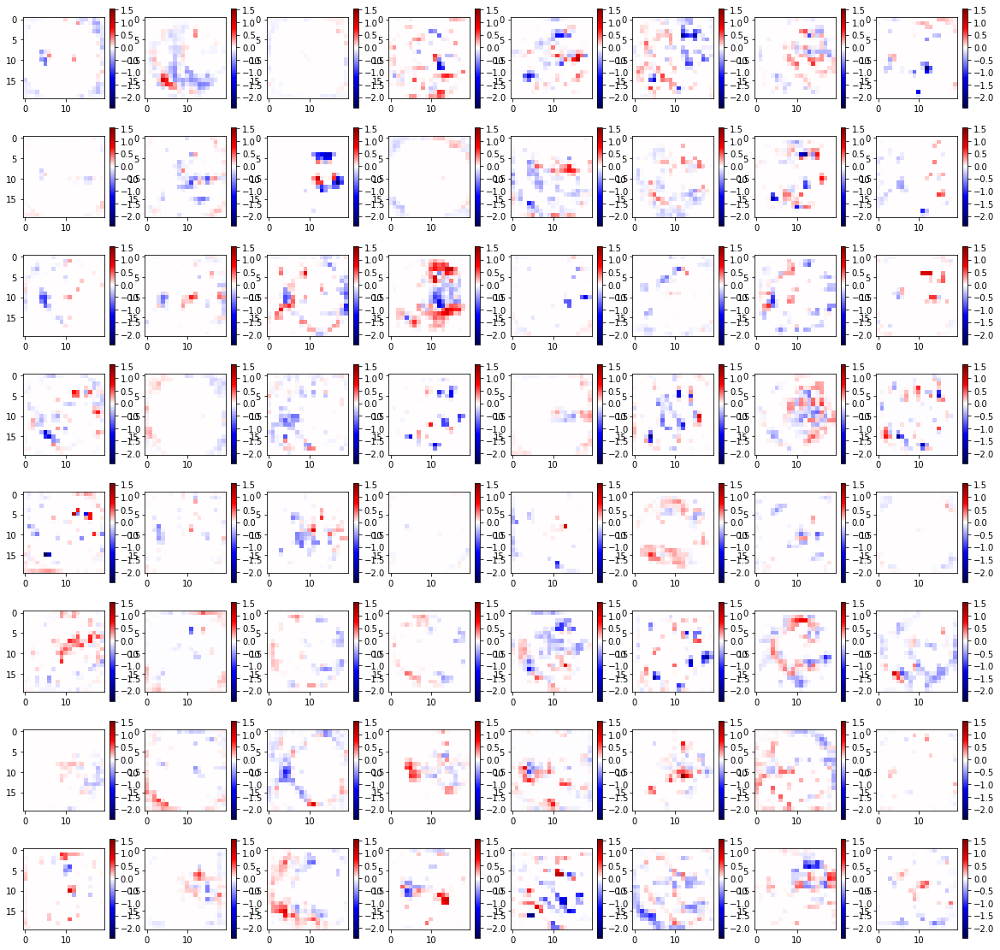

In [36]:
vis.plot_scores(img_target,score_rf189)

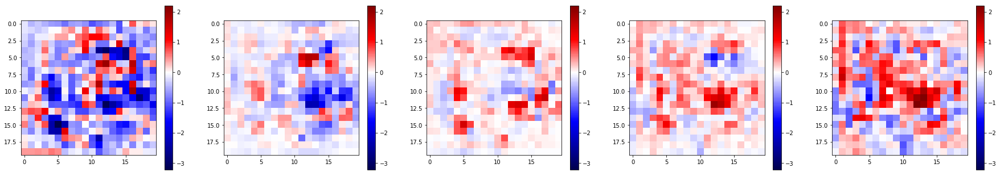

In [37]:
#vis.plot_scores(img_target,score_rf189.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf189.sum(1).unsqueeze(0), figsize=(50,50))

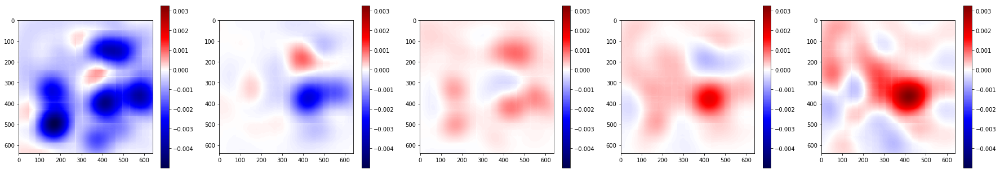

In [38]:
tmp = vis.map_scores_to_input_sz(score_rf189.sum(1).unsqueeze(1), 189)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0, tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [39]:
layer = 10
rf125_p = layer_vals[layer]
rf125, mp_idx = F.max_pool2d(rf125_p, 2, 2, return_indices = True)  # 1x64x5x5
#del rf125_p
score_rf125, score_k189 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf189, rf125, rf189, me.rf189)
#del score_rf189, 
layer = 10
rf125 = layer_vals[layer]
vis.stats(score_rf125)

Max: 7.200449466705322, Min: -12.739177703857422, Avg: -0.0011256196450606987, Std:0.19642142610972496
torch.Size([5, 64, 20, 20])


(7.200449466705322,
 -12.739177703857422,
 -0.0011256196450606987,
 0.19642142610972496)

torch.Size([5, 1, 20, 20])


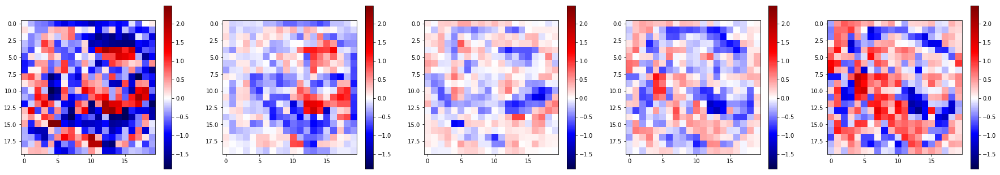

In [40]:
score_k189 = score_k189.sum(1).unsqueeze(1)
print(score_k189.size())
#vis.plot_scores(img_target, score_k189, figsize=(50,50))
vis.plot_scores(0,score_k189.sum(1).unsqueeze(0), figsize=(50,50))

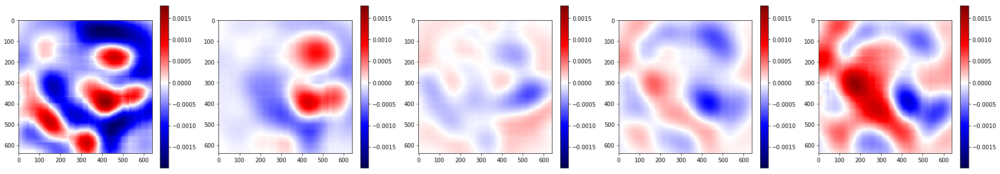

Max: 0.001788452616892755, Min: -0.001991763710975647, Avg: -7.663967369502106e-05, Std:0.0004457480607013751
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  8.1416e-05  8.0716e-05  7.9978e-05  ...   5.1359e-04  5.1181e-04  5.0998e-04
  8.2018e-05  8.1308e-05  8.0558e-05  ...   5.1447e-04  5.1271e-04  5.1092e-04
  8.2623e-05  8.1904e-05  8.1144e-05  ...   5.1525e-04  5.1353e-04  5.1177e-04
                 ...                   ⋱                   ...                
  5.1986e-04  5.2562e-04  5.3140e-04  ...   3.5265e-04  3.5155e-04  3.5045e-04
  5.1705e-04  5.2278e-04  5.2853e-04  ...   3.5137e-04  3.5027e-04  3.4917e-04
  5.1418e-04  5.1988e-04  5.2560e-04  ...   3.5012e-04  3.4901e-04  3.4791e-04
      ⋮  

( 1 , 0 ,.,.) = 
  9.8644e-06  9.1622e-06  8.4350e-06  ...   1.4042e-04  1.3983e-04  1.3922e-04
  1.0068e-05  9.3592e-06  8.6247e-06  ...   1.4061e-04  1.4002e-04  1.3942e-04
  1.0273e-05  9.5572e-06  8.8155e-06  ...   1.4077e-04  1.4019e-04  1.3960e-04
                 ...                   ⋱                   ...                
  1.6081e-05  1.6077e-05  1.6068e-05  ...   1.5851e-04  1.5760e-0

In [41]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k189, 189)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50)
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k189

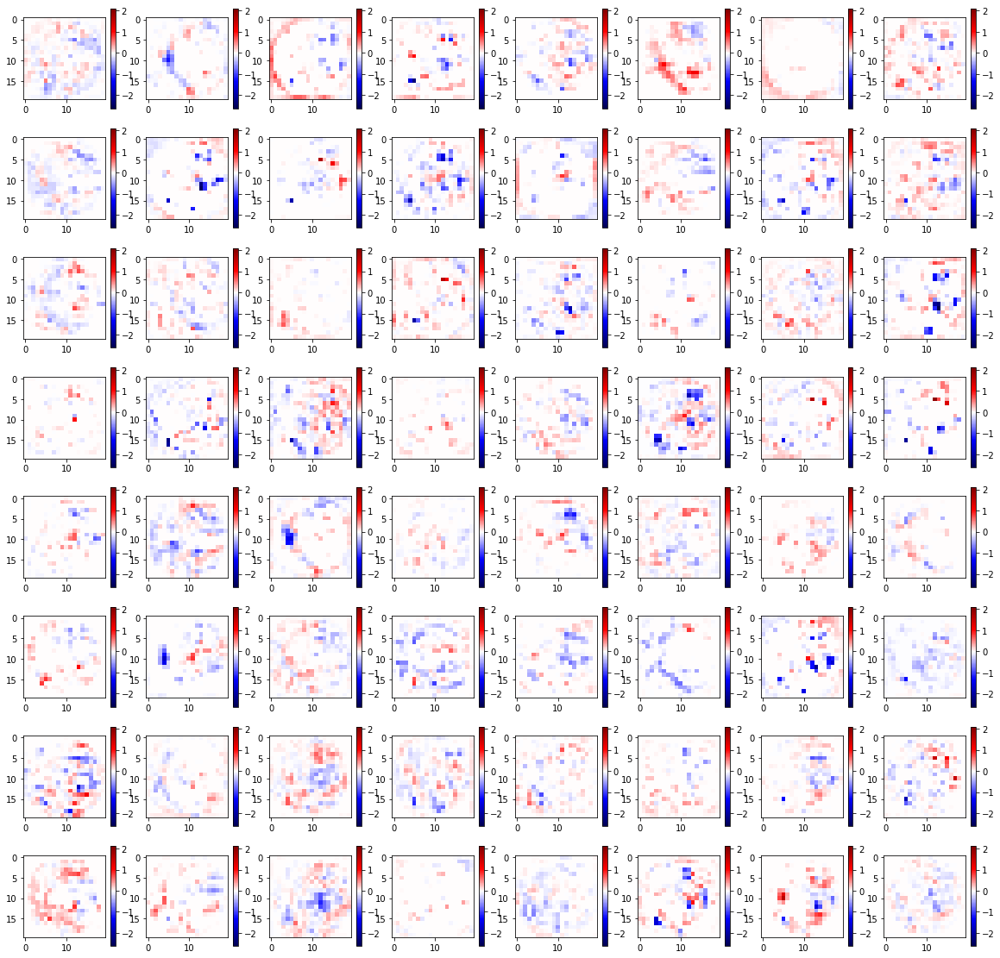

In [42]:
vis.plot_scores(img_target,score_rf125)

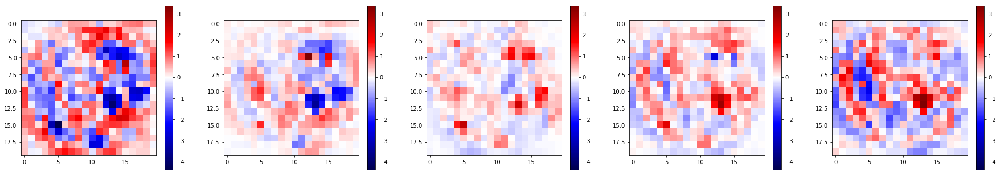

In [43]:
#vis.plot_scores(img_target,score_rf125.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf125.sum(1).unsqueeze(0), figsize=(50,50))

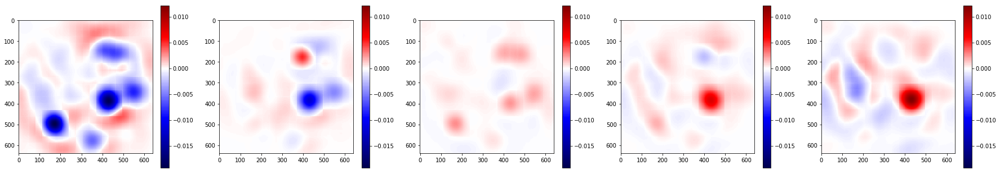

In [44]:
tmp = vis.map_scores_to_input_sz(score_rf125.sum(1).unsqueeze(1), 125)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [45]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf125, mp_idx)
#del score_rf125, mp_idx
layer = 9
rf93 = layer_vals[layer]
score_rf93, score_k125 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf93, rf125_p, me.rf125)
#del score_mp, rf93
vis.stats(score_rf93)

Max: 5.981862545013428, Min: -10.887755393981934, Avg: -0.000353413100337901, Std:0.07917914146139246
torch.Size([5, 64, 40, 40])


(5.981862545013428,
 -10.887755393981934,
 -0.000353413100337901,
 0.07917914146139246)

torch.Size([5, 1, 40, 40])


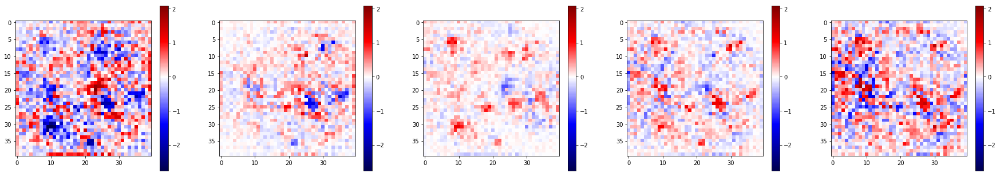

In [46]:
score_k125 = score_k125.sum(1).unsqueeze(1)
print(score_k125.size())
#vis.plot_scores(img_target, score_k125, figsize=(50,50))
vis.plot_scores(0,score_k125.sum(1).unsqueeze(0), figsize=(50,50))

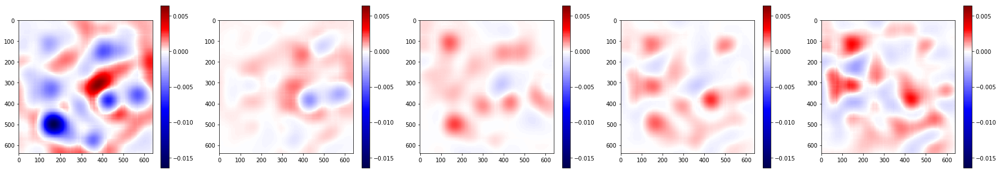

Max: 0.00643076840788126, Min: -0.016576392576098442, Avg: 1.8002042088119392e-05, Std:0.001188482737313092
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
 -1.6945e-04 -1.7589e-04 -1.8228e-04  ...   1.1264e-03  1.1160e-03  1.1052e-03
 -1.7287e-04 -1.7943e-04 -1.8593e-04  ...   1.1366e-03  1.1261e-03  1.1152e-03
 -1.7616e-04 -1.8282e-04 -1.8943e-04  ...   1.1464e-03  1.1358e-03  1.1248e-03
                 ...                   ⋱                   ...                
  7.0187e-04  7.0645e-04  7.1073e-04  ...   2.1467e-06  6.2487e-06  1.0601e-05
  6.9506e-04  6.9963e-04  7.0391e-04  ...   7.1093e-06  1.1085e-05  1.5309e-05
  6.8816e-04  6.9271e-04  6.9698e-04  ...   1.2263e-05  1.6111e-05  2.0203e-05
      ⋮  

( 1 , 0 ,.,.) = 
  1.2598e-04  1.2670e-04  1.2731e-04  ...   3.3770e-04  3.3449e-04  3.3116e-04
  1.2806e-04  1.2879e-04  1.2941e-04  ...   3.4041e-04  3.3718e-04  3.3382e-04
  1.3006e-04  1.3081e-04  1.3143e-04  ...   3.4296e-04  3.3970e-04  3.3632e-04
                 ...                   ⋱                   ...                
 -1.1254e-05 -1.1815e-05 -1.2372e-05  ...   6.3072e-05  6.3513e-0

In [47]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k125, 125)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k125

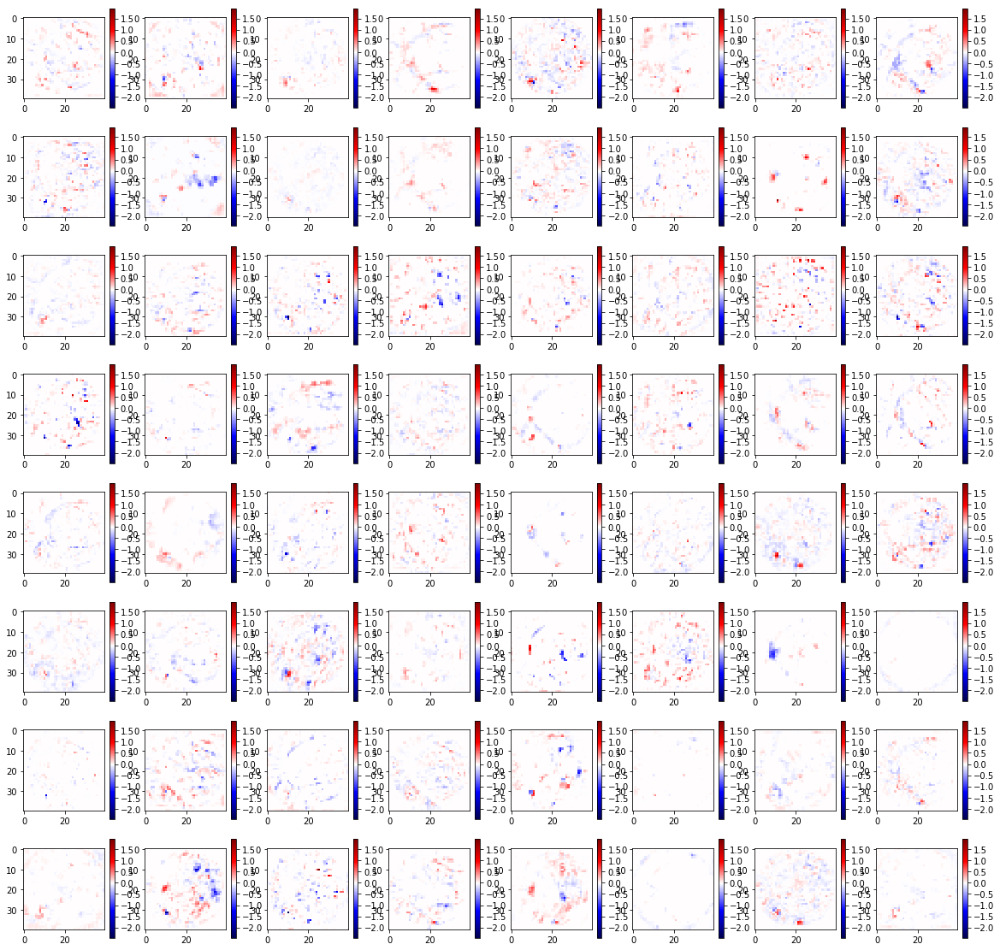

In [48]:
vis.plot_scores(img_target,score_rf93)

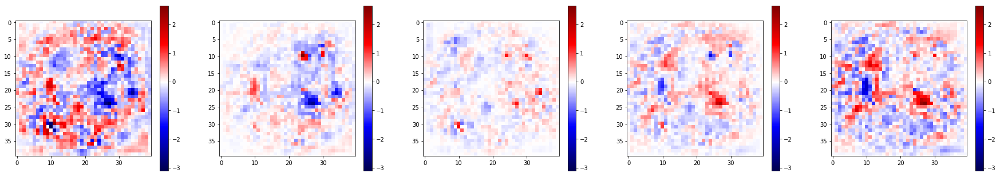

In [49]:
#vis.plot_scores(img_target,score_rf93.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf93.sum(1).unsqueeze(0), figsize=(50,50))

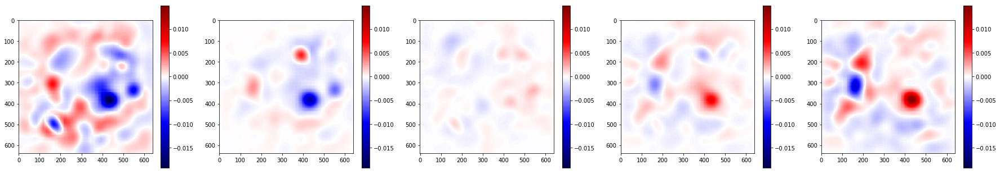

In [50]:
tmp = vis.map_scores_to_input_sz(score_rf93.sum(1).unsqueeze(1), 93)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [51]:
layer = 8
rf61_p = layer_vals[layer]
rf61, mp_idx = F.max_pool2d(rf61_p, 2, 2, return_indices = True)  # 1x64x5x5
score_rf61, score_k93 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf93, rf61, rf93, me.rf93)
#del score_rf93, val
vis.stats(score_rf61)

Max: 7.401787281036377, Min: -18.24847412109375, Avg: -0.00033753537353131604, Std:0.10855066936173227
torch.Size([5, 64, 40, 40])


(7.401787281036377,
 -18.24847412109375,
 -0.00033753537353131604,
 0.10855066936173227)

torch.Size([5, 1, 40, 40])


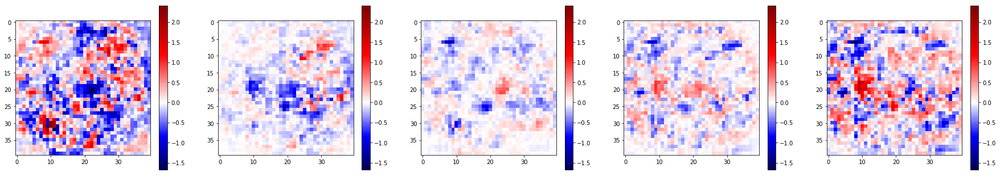

In [52]:
score_k93 = score_k93.sum(1).unsqueeze(1)
print(score_k93.size())
#vis.plot_scores(img_target, score_k93, figsize=(50,50))
vis.plot_scores(0,score_k93.sum(1).unsqueeze(0), figsize=(50,50))

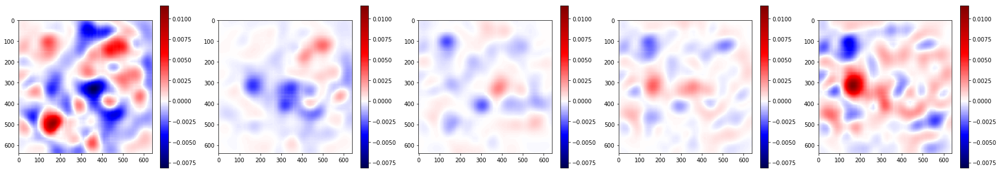

Max: 0.011636764742434025, Min: -0.008191878907382488, Avg: -3.969435740299683e-06, Std:0.0012354762757171257
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  3.1475e-05  3.3072e-05  3.4713e-05  ...   5.7373e-04  5.7872e-04  5.8372e-04
  3.4023e-05  3.5762e-05  3.7546e-05  ...   5.6708e-04  5.7245e-04  5.7783e-04
  3.6565e-05  3.8445e-05  4.0370e-05  ...   5.6026e-04  5.6599e-04  5.7175e-04
                 ...                   ⋱                   ...                
  6.1500e-04  6.1925e-04  6.2347e-04  ...   7.8815e-05  8.1052e-05  8.3459e-05
  6.1168e-04  6.1595e-04  6.2021e-04  ...   7.8323e-05  8.0619e-05  8.3083e-05
  6.0824e-04  6.1255e-04  6.1683e-04  ...   7.8222e-05  8.0567e-05  8.3077e-05
      ⋮  

( 1 , 0 ,.,.) = 
  9.5382e-05  9.4909e-05  9.4328e-05  ...   1.5285e-04  1.5501e-04  1.5716e-04
  9.6750e-05  9.6266e-05  9.5673e-05  ...   1.5061e-04  1.5288e-04  1.5515e-04
  9.8089e-05  9.7594e-05  9.6988e-05  ...   1.4835e-04  1.5073e-04  1.5311e-04
                 ...                   ⋱                   ...                
  2.3818e-05  2.4185e-05  2.4523e-05  ...   7.9013e-05  7.9105e-0

In [53]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k93, 93)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k93

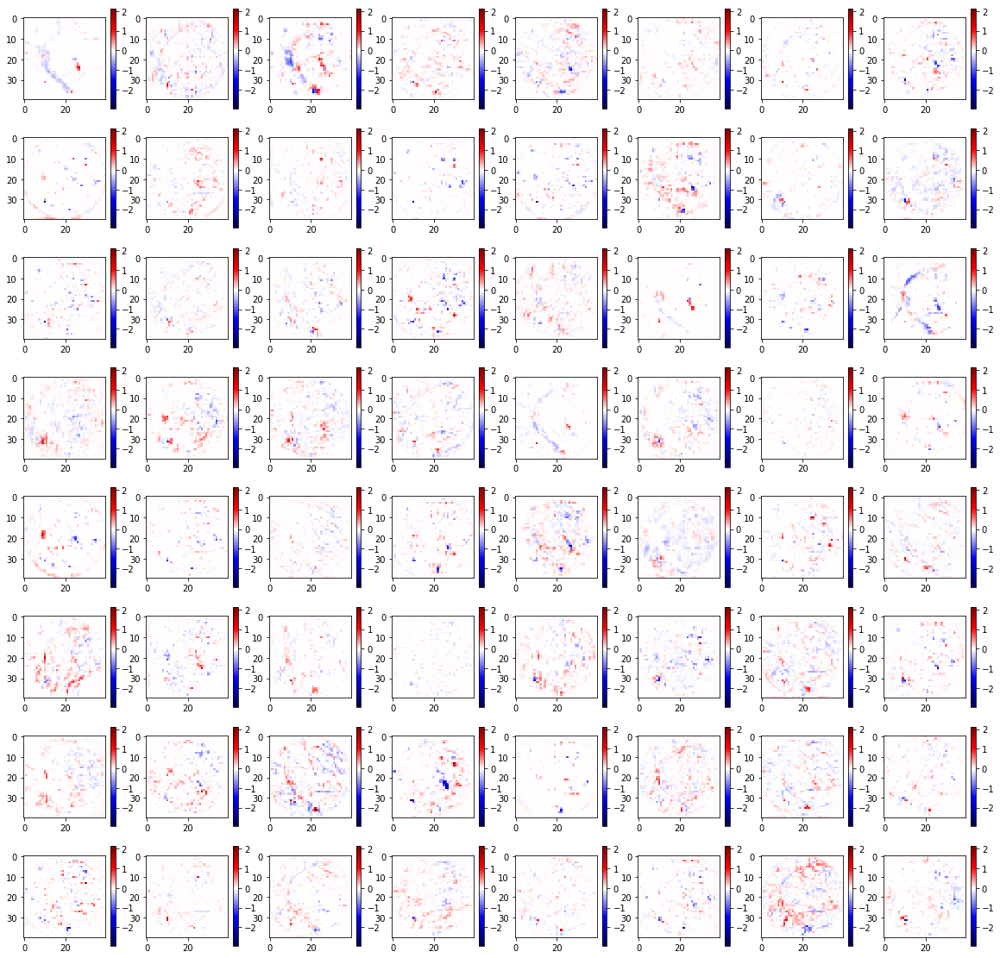

In [54]:
vis.plot_scores(img_target,score_rf61)

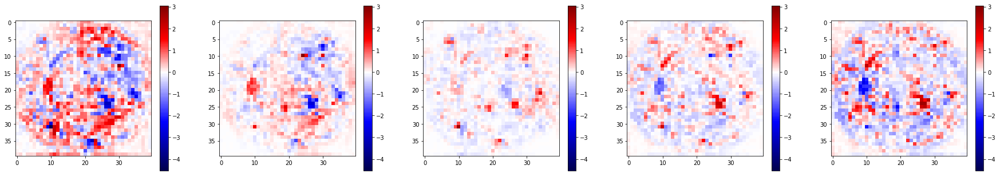

In [55]:
#vis.plot_scores(img_target,score_rf61.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf61.sum(1).unsqueeze(0), figsize=(50,50))

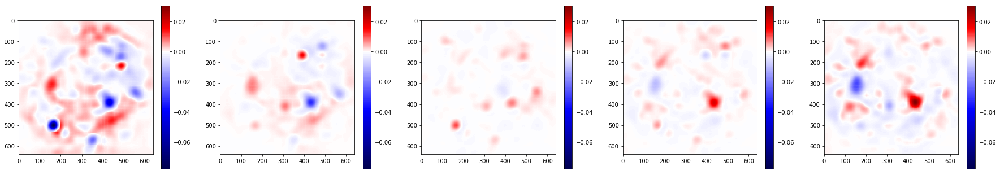

In [56]:
tmp = vis.map_scores_to_input_sz(score_rf61.sum(1).unsqueeze(1), 61)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [57]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf61, mp_idx)
#del score_rf61, mp_idx
layer = 7
rf45 = layer_vals[layer]
score_rf45, score_k61 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf45, rf61_p, me.rf61)
#del score_mp, rf45
vis.stats(score_rf45)

Max: 12.553932189941406, Min: -17.085023880004883, Avg: 5.2998503565246254e-05, Std:0.051321961675574096
torch.Size([5, 64, 80, 80])


(12.553932189941406,
 -17.085023880004883,
 5.2998503565246254e-05,
 0.051321961675574096)

torch.Size([5, 1, 80, 80])


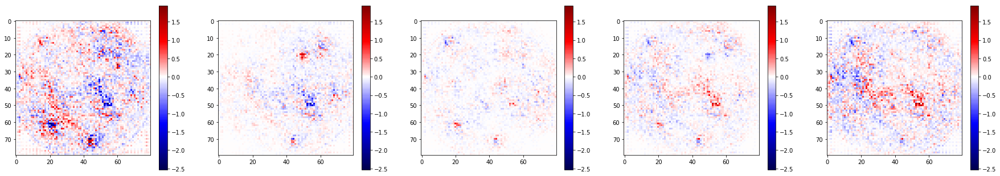

In [58]:
score_k61 = score_k61.sum(1).unsqueeze(1)
print(score_k61.size())
#vis.plot_scores(img_target, score_k61, figsize=(50,50))
vis.plot_scores(0,score_k61.sum(1).unsqueeze(0), figsize=(50,50))

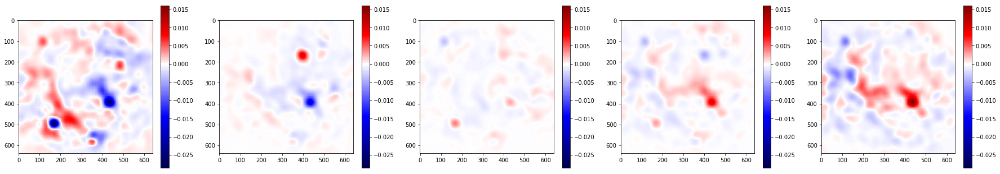

Max: 0.01612282544374466, Min: -0.02901856228709221, Avg: -0.00013738234733444944, Std:0.0015912877834708438
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  2.3094e-05  2.4432e-05  2.5825e-05  ...   7.8045e-04  7.8199e-04  7.8284e-04
  2.5890e-05  2.7374e-05  2.8911e-05  ...   7.8090e-04  7.8293e-04  7.8422e-04
  2.8750e-05  3.0379e-05  3.2061e-05  ...   7.8071e-04  7.8326e-04  7.8502e-04
                 ...                   ⋱                   ...                
  7.3407e-04  7.4520e-04  7.5633e-04  ...   4.9375e-04  4.7497e-04  4.5613e-04
  7.2722e-04  7.3817e-04  7.4911e-04  ...   4.7393e-04  4.5621e-04  4.3844e-04
  7.1992e-04  7.3066e-04  7.4138e-04  ...   4.5404e-04  4.3739e-04  4.2069e-04
      ⋮  

( 1 , 0 ,.,.) = 
  1.0018e-04  9.9808e-05  9.9331e-05  ...   2.4245e-04  2.4243e-04  2.4217e-04
  1.0100e-04  1.0057e-04  1.0003e-04  ...   2.4398e-04  2.4406e-04  2.4386e-04
  1.0172e-04  1.0121e-04  1.0061e-04  ...   2.4535e-04  2.4551e-04  2.4540e-04
                 ...                   ⋱                   ...                
 -2.1538e-05 -2.3202e-05 -2.4800e-05  ...   1.7855e-04  1.7329e-0

In [59]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k61, 61)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k61

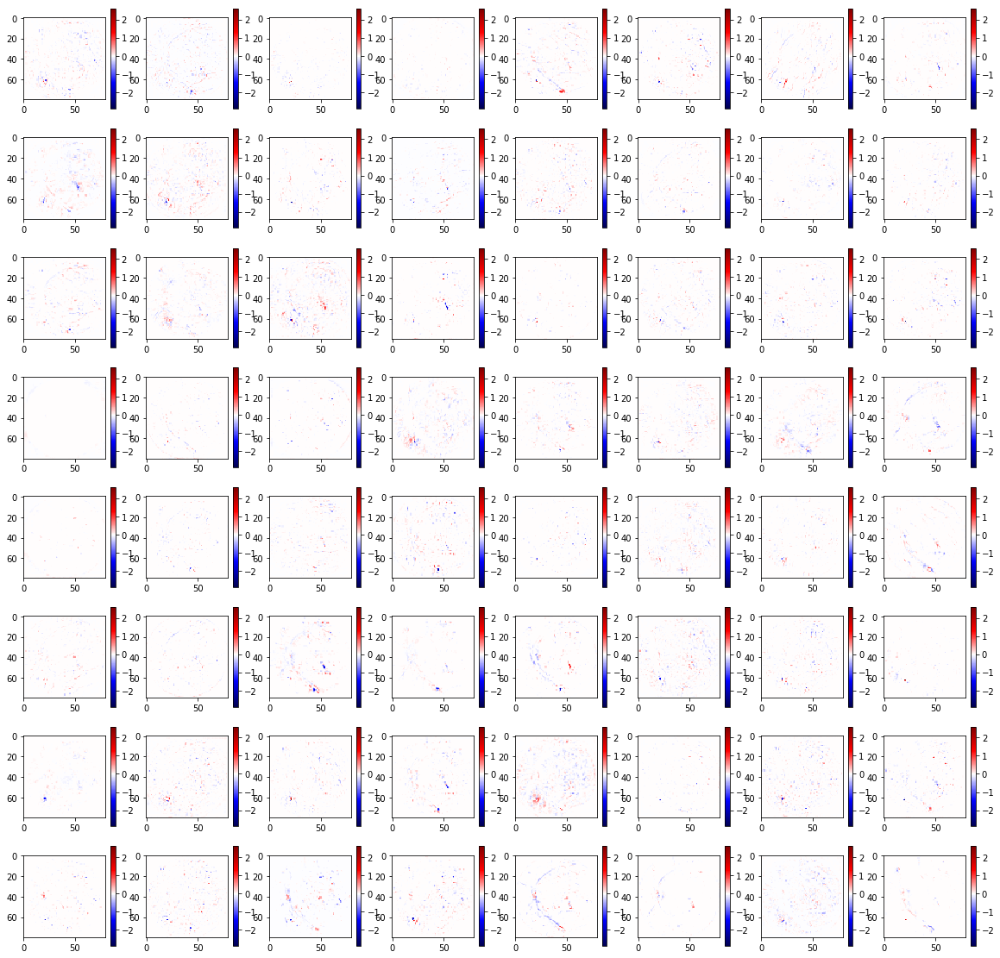

In [60]:
vis.plot_scores(img_target,score_rf45)

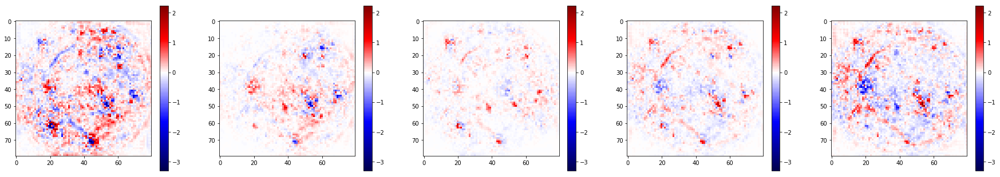

In [61]:
#vis.plot_scores(img_target,score_rf45.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf45.sum(1).unsqueeze(0), figsize=(50,50))

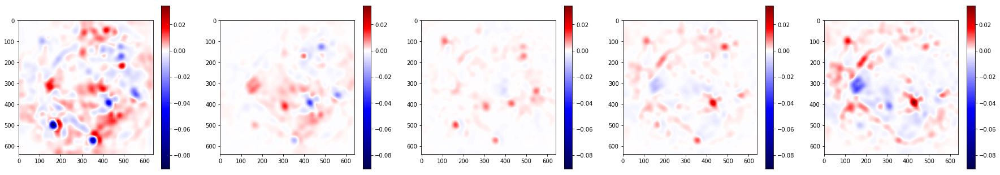

In [62]:
tmp = vis.map_scores_to_input_sz(score_rf45.sum(1).unsqueeze(1), 45)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [63]:
layer = 6
rf29_p = layer_vals[layer]
rf29, mp_idx = F.max_pool2d(rf29_p, 2, 2, return_indices = True)  # 1x64x5x5
#del rf29_p
score_rf29, score_k45 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf45, rf29, rf45, me.rf45)
#del score_rf45, val
vis.stats(score_rf29)

Max: 16.318115234375, Min: -21.605670928955078, Avg: -2.3712126556145256e-05, Std:0.0685936251277833
torch.Size([5, 64, 80, 80])


(16.318115234375,
 -21.605670928955078,
 -2.3712126556145256e-05,
 0.0685936251277833)

torch.Size([5, 1, 80, 80])


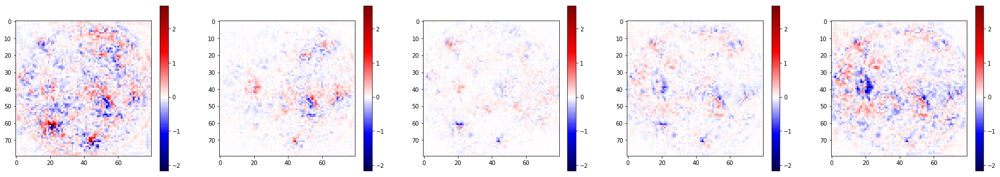

In [64]:
score_k45 = score_k45.sum(1).unsqueeze(1)
print(score_k45.size())
#vis.plot_scores(img_target, score_k45, figsize=(50,50))
vis.plot_scores(0,score_k45.sum(1).unsqueeze(0), figsize=(50,50))

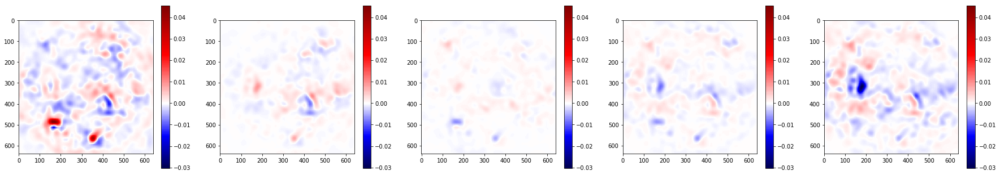

Max: 0.04638511687517166, Min: -0.030861297622323036, Avg: 7.671062200151175e-05, Std:0.0019549206248127005
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
 -4.2532e-05 -4.4479e-05 -4.5952e-05  ...   7.9601e-04  7.9146e-04  7.8696e-04
 -4.4746e-05 -4.6677e-05 -4.8079e-05  ...   8.0985e-04  8.0437e-04  7.9896e-04
 -4.6750e-05 -4.8638e-05 -4.9939e-05  ...   8.2483e-04  8.1830e-04  8.1187e-04
                 ...                   ⋱                   ...                
  7.4600e-04  7.5732e-04  7.6866e-04  ...   3.1560e-04  3.0985e-04  3.0381e-04
  7.3688e-04  7.4786e-04  7.5886e-04  ...   3.0886e-04  3.0327e-04  2.9740e-04
  7.2752e-04  7.3816e-04  7.4881e-04  ...   3.0186e-04  2.9645e-04  2.9076e-04
      ⋮  

( 1 , 0 ,.,.) = 
  9.2875e-05  9.1608e-05  9.0266e-05  ...   2.5794e-04  2.5510e-04  2.5226e-04
  9.3606e-05  9.2268e-05  9.0858e-05  ...   2.6430e-04  2.6101e-04  2.5774e-04
  9.4322e-05  9.2920e-05  9.1448e-05  ...   2.7101e-04  2.6724e-04  2.6350e-04
                 ...                   ⋱                   ...                
 -3.9552e-05 -4.1989e-05 -4.4216e-05  ...   1.2574e-04  1.2431e-0

In [65]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k45.sum(1).unsqueeze(1), 45)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k45

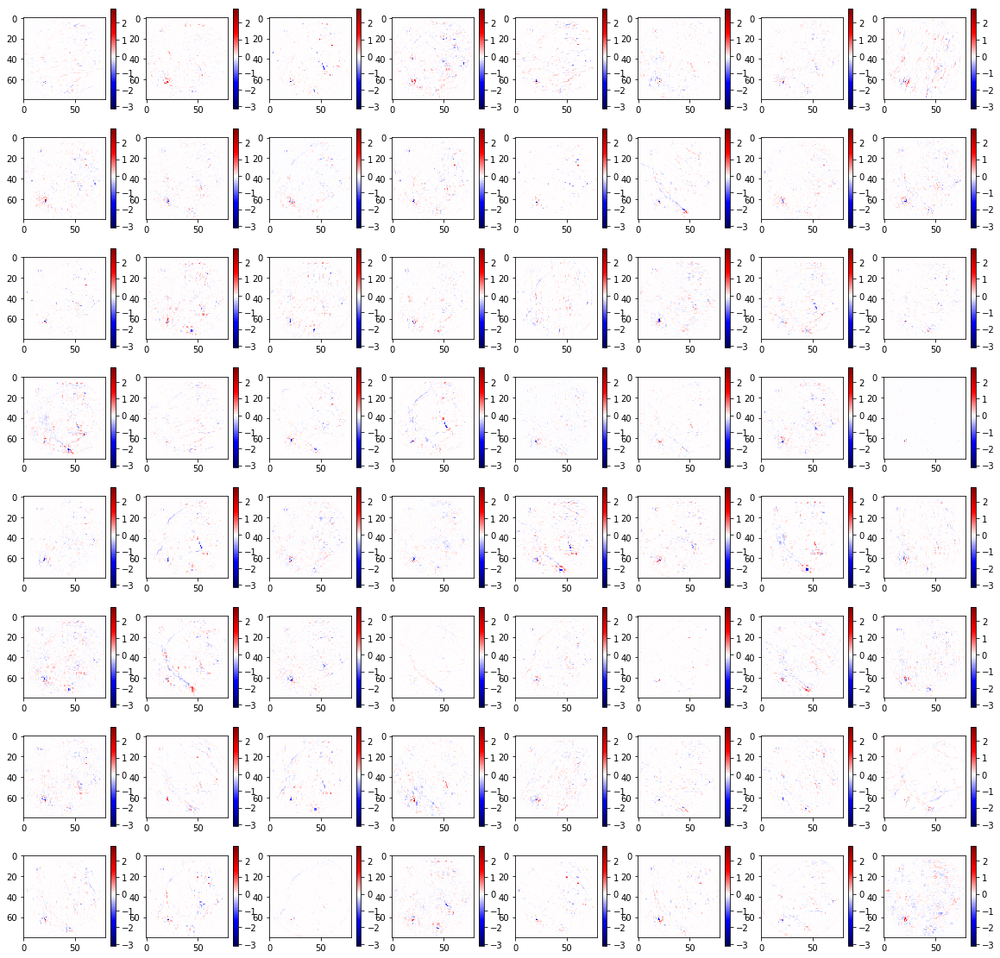

In [66]:
vis.plot_scores(img_target,score_rf29)

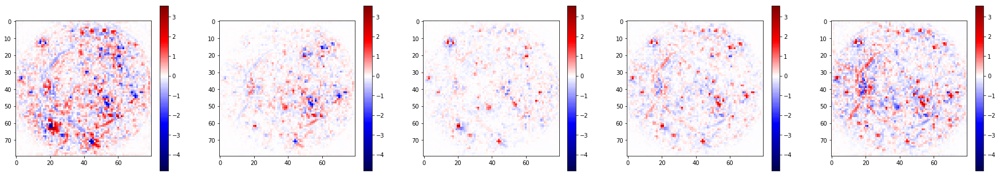

In [67]:
#vis.plot_scores(img_target,score_rf29.sum(1).unsqueeze(1), figsize=(50,50), threshold=None)
vis.plot_scores(0,score_rf29.sum(1).unsqueeze(0), figsize=(50,50))

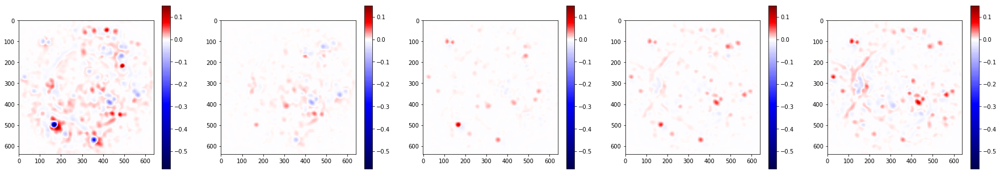

In [68]:
tmp = vis.map_scores_to_input_sz(score_rf29.sum(1).unsqueeze(1), 29)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [69]:
#del score_rf637, score_rf509, score_rf381, score_rf253, score_rf189
#del score_rf125, score_rf93, score_rf61, score_rf45, score_mp
#del rf637, rf509, rf381, rf253, rf189, rf125, rf93, rf61, rf45
#del rf509_p, rf253_p, rf125_p, rf61_p

In [70]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf29, mp_idx)
#del score_rf29, mp_idx
layer = 5
rf21 = layer_vals[layer]
score_rf21, score_k29 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf21, rf29_p, me.rf29)
#del score_mp, rf45
vis.stats(score_rf21)

Max: 16.687583923339844, Min: -21.55489730834961, Avg: 6.940219486064837e-07, Std:0.03120900725217724
torch.Size([5, 64, 160, 160])


(16.687583923339844,
 -21.55489730834961,
 6.940219486064837e-07,
 0.03120900725217724)

torch.Size([5, 1, 160, 160])


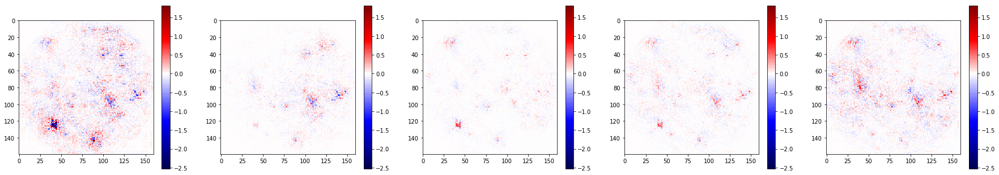

In [71]:
score_k29 = score_k29.sum(1).unsqueeze(1)
print(score_k29.size())
#vis.plot_scores(img_target, score_k29, figsize=(50,50))
vis.plot_scores(0,score_k29.sum(1).unsqueeze(0), figsize=(50,50))

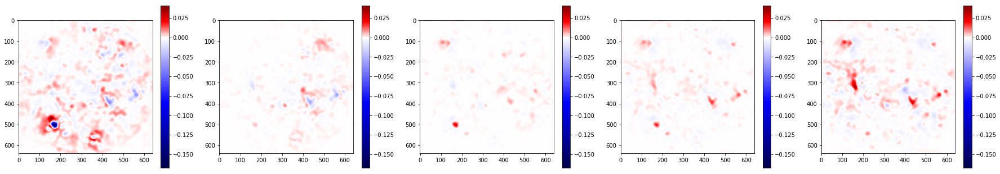

Max: 0.04146198183298111, Min: -0.18272458016872406, Avg: -2.648821816951114e-05, Std:0.002957164768684258
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  7.3368e-05  7.2653e-05  6.7995e-05  ...   7.4990e-04  7.6378e-04  7.7368e-04
  7.1799e-05  7.0433e-05  6.4995e-05  ...   7.5215e-04  7.6671e-04  7.7718e-04
  6.5919e-05  6.3690e-05  5.7390e-05  ...   7.5380e-04  7.6865e-04  7.7944e-04
                 ...                   ⋱                   ...                
  8.4824e-04  8.7353e-04  8.9849e-04  ...   1.9611e-04  1.8863e-04  1.8469e-04
  8.3507e-04  8.5883e-04  8.8209e-04  ...   2.0545e-04  1.9776e-04  1.9324e-04
  8.1964e-04  8.4176e-04  8.6328e-04  ...   2.1399e-04  2.0625e-04  2.0128e-04
      ⋮  

( 1 , 0 ,.,.) = 
  1.6587e-04  1.7125e-04  1.7541e-04  ...   2.0571e-04  2.1232e-04  2.1783e-04
  1.7108e-04  1.7693e-04  1.8153e-04  ...   2.0504e-04  2.1197e-04  2.1780e-04
  1.7453e-04  1.8073e-04  1.8570e-04  ...   2.0474e-04  2.1179e-04  2.1780e-04
                 ...                   ⋱                   ...                
 -5.2970e-05 -5.7933e-05 -6.2857e-05  ...   1.3695e-04  1.3288e-0

In [72]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k29, 29)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k29

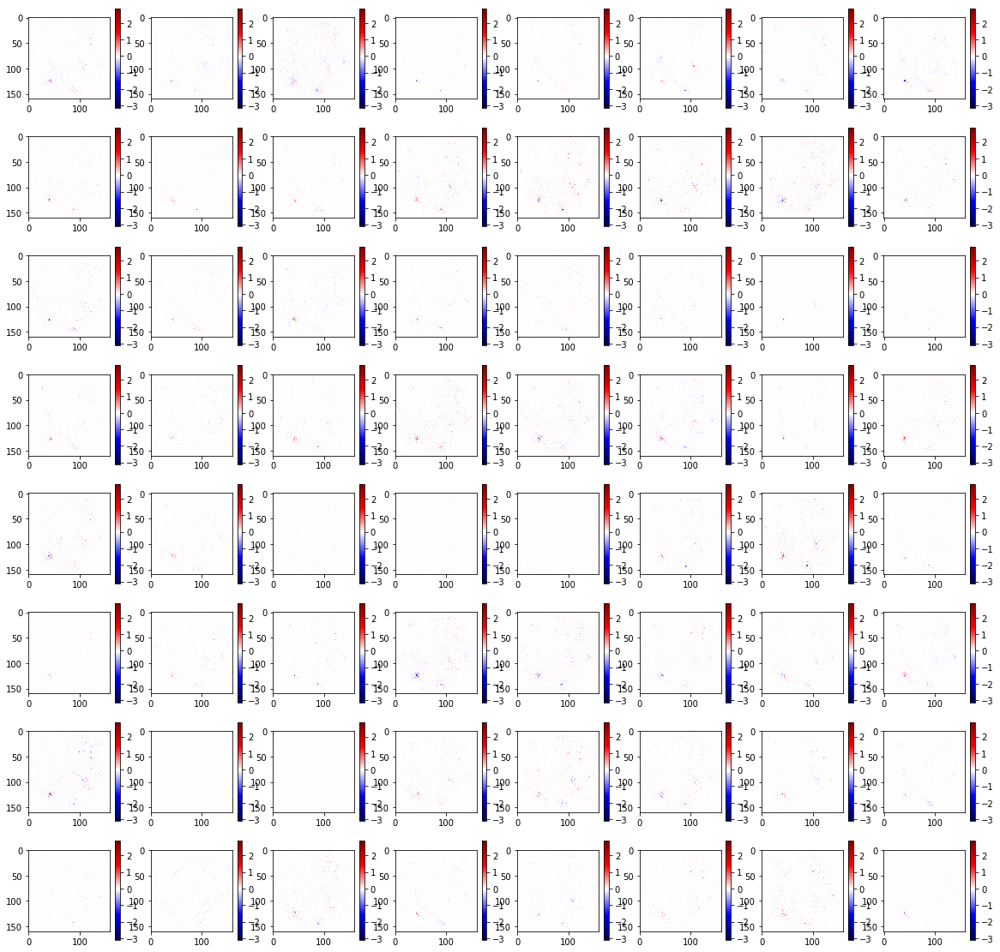

In [73]:
vis.plot_scores(img_target, score_rf21)

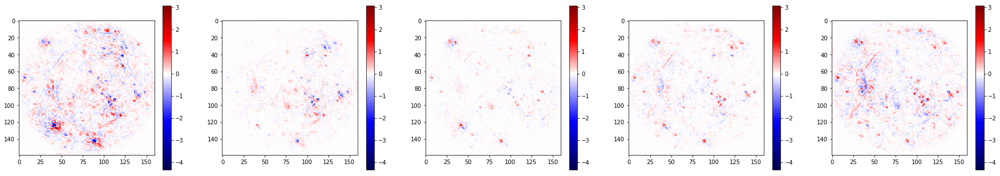

In [74]:
#vis.plot_scores(img_target,score_rf21.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf21.sum(1).unsqueeze(0), figsize=(50,50))

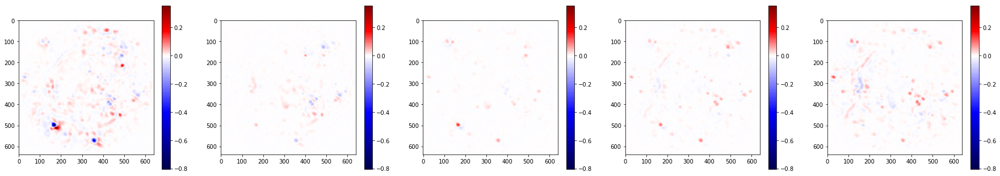

In [75]:
tmp = vis.map_scores_to_input_sz(score_rf21.sum(1).unsqueeze(1), 21)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [76]:
layer = 4
rf13_p = layer_vals[layer]
rf13, mp_idx = F.max_pool2d(rf13_p, 2, 2, return_indices = True)  # 1x64x5x5
score_rf13, score_k21 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf21, rf13, rf21, me.rf21)
vis.stats(score_rf13)

Max: 26.19158935546875, Min: -56.68022918701172, Avg: -1.5063522884623732e-05, Std:0.08795524810760041
torch.Size([5, 32, 160, 160])


(26.19158935546875,
 -56.68022918701172,
 -1.5063522884623732e-05,
 0.08795524810760041)

torch.Size([5, 1, 160, 160])


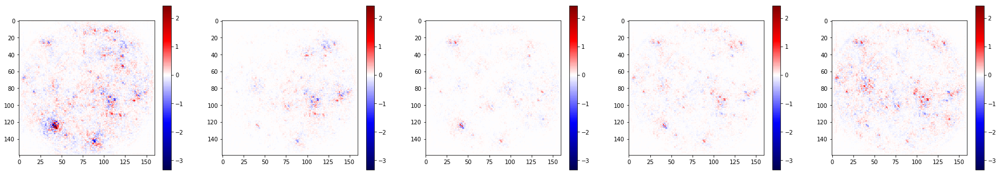

In [77]:
score_k21 = score_k21.sum(1).unsqueeze(1)
print(score_k21.size())
#vis.plot_scores(img_target, score_k21, figsize=(50,50))
vis.plot_scores(0,score_k21.sum(1).unsqueeze(0), figsize=(50,50))

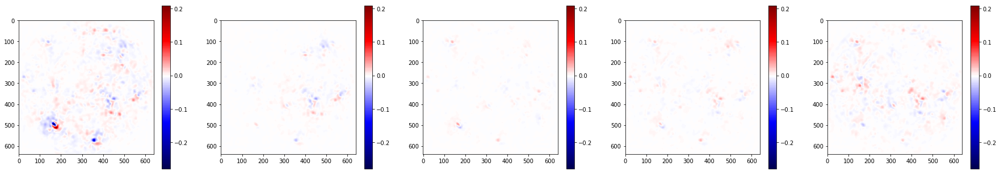

Max: 0.23147784173488617, Min: -0.32203203439712524, Avg: 3.290313228266869e-05, Std:0.004440351731681887
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  1.1806e-04  1.2089e-04  1.1743e-04  ...   7.5191e-04  7.6221e-04  7.7019e-04
  1.1950e-04  1.2201e-04  1.1797e-04  ...   7.9530e-04  8.0191e-04  8.0532e-04
  1.1376e-04  1.1554e-04  1.1082e-04  ...   8.5295e-04  8.5421e-04  8.5109e-04
                 ...                   ⋱                   ...                
  1.0253e-03  1.0757e-03  1.1189e-03  ...   5.1784e-04  4.9743e-04  4.6619e-04
  1.0079e-03  1.0570e-03  1.0993e-03  ...   4.8795e-04  4.7066e-04  4.4322e-04
  9.7929e-04  1.0253e-03  1.0654e-03  ...   4.5298e-04  4.3846e-04  4.1494e-04
      ⋮  

( 1 , 0 ,.,.) = 
  1.6550e-04  1.6859e-04  1.6957e-04  ...   2.1756e-04  2.2269e-04  2.2671e-04
  1.6743e-04  1.7010e-04  1.7057e-04  ...   2.3229e-04  2.3602e-04  2.3840e-04
  1.6616e-04  1.6810e-04  1.6784e-04  ...   2.5209e-04  2.5374e-04  2.5371e-04
                 ...                   ⋱                   ...                
 -1.2165e-04 -1.3714e-04 -1.5058e-04  ...   2.9036e-04  2.7825e-0

In [78]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k21, 21)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k21

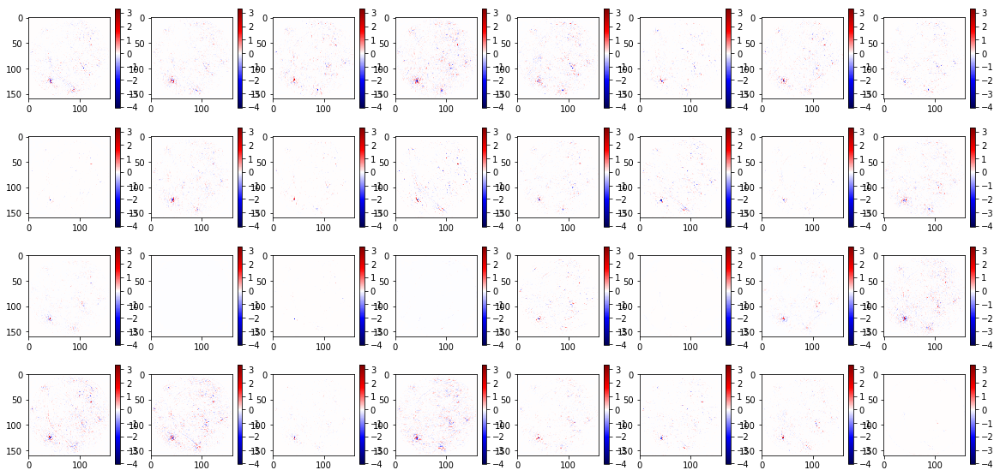

In [79]:
vis.plot_scores(img_target, score_rf13)

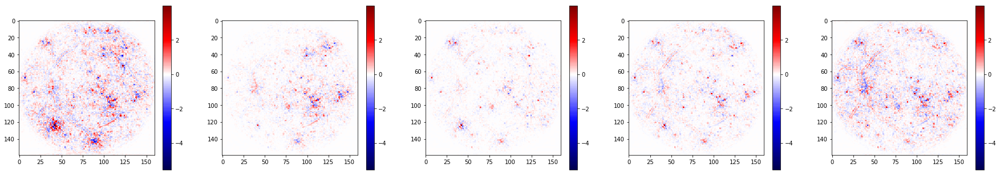

In [80]:
#vis.plot_scores(img_target,score_rf13.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf13.sum(1).unsqueeze(0), figsize=(50,50))

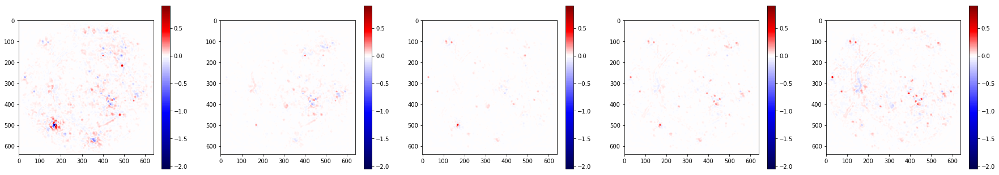

In [81]:
tmp = vis.map_scores_to_input_sz(score_rf13.sum(1).unsqueeze(1), 13)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [82]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf13, mp_idx)
#del score_rf29, mp_idx
layer = 3
rf9 = layer_vals[layer]
score_rf9, score_k13 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf9, rf13_p, me.rf13)
#del score_mp, rf45
vis.stats(score_rf9)

Max: 14.683265686035156, Min: -31.207115173339844, Avg: -7.416107391821525e-06, Std:0.031944198540474256
torch.Size([5, 32, 320, 320])


(14.683265686035156,
 -31.207115173339844,
 -7.416107391821525e-06,
 0.031944198540474256)

torch.Size([5, 1, 320, 320])


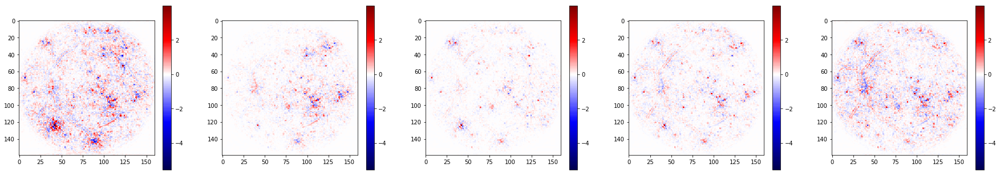

In [83]:
score_k13 = score_k13.sum(1).unsqueeze(1)
print(score_k13.size())
#vis.plot_scores(img_target, score_k13, figsize=(50,50))
vis.plot_scores(0,score_rf13.sum(1).unsqueeze(0), figsize=(50,50))

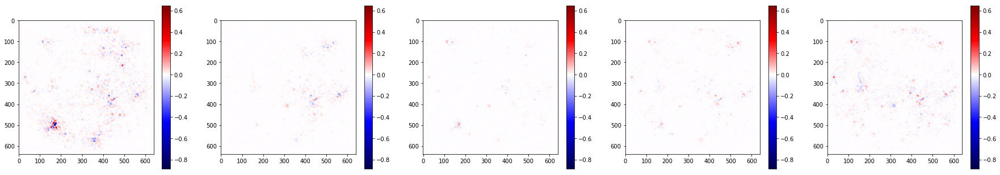

Max: 0.9088202118873596, Min: -1.4287272691726685, Avg: 2.9201817954646324e-05, Std:0.01387330661832968
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  3.8297e-04  4.1099e-04  4.0081e-04  ...   1.8023e-03  1.6064e-03  1.3251e-03
  4.7172e-04  5.1479e-04  5.1004e-04  ...   2.3045e-03  2.0186e-03  1.6205e-03
  5.3932e-04  6.0247e-04  6.1178e-04  ...   2.7997e-03  2.4240e-03  1.9160e-03
                 ...                   ⋱                   ...                
  1.5245e-03  1.7156e-03  1.8713e-03  ...   1.5168e-03  1.5590e-03  1.4510e-03
  1.4017e-03  1.5594e-03  1.6881e-03  ...   1.3791e-03  1.4357e-03  1.3514e-03
  1.2546e-03  1.3762e-03  1.4765e-03  ...   1.1604e-03  1.2220e-03  1.1650e-03
      ⋮  

( 1 , 0 ,.,.) = 
  1.5185e-04  1.5264e-04  1.5304e-04  ...   5.8002e-04  5.1293e-04  4.1681e-04
  1.3896e-04  1.3628e-04  1.3368e-04  ...   7.5447e-04  6.5622e-04  5.1952e-04
  1.2007e-04  1.1299e-04  1.0659e-04  ...   9.2699e-04  7.9773e-04  6.2278e-04
                 ...                   ⋱                   ...                
 -2.0411e-04 -2.5239e-04 -2.9535e-04  ...   6.8644e-04  7.1191e-0

In [84]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k13, 13)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k13

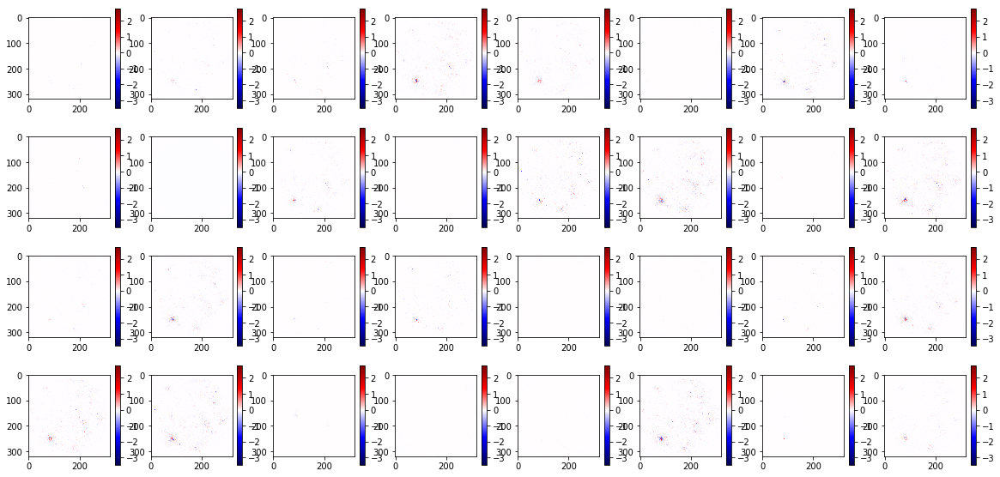

In [85]:
vis.plot_scores(img_target, score_rf9)

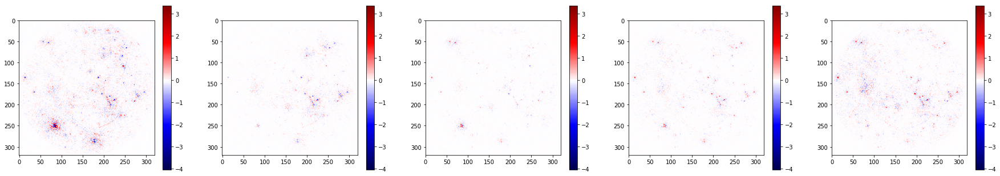

In [86]:
#vis.plot_scores(img_target,score_rf9.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf9.sum(1).unsqueeze(0), figsize=(50,50))

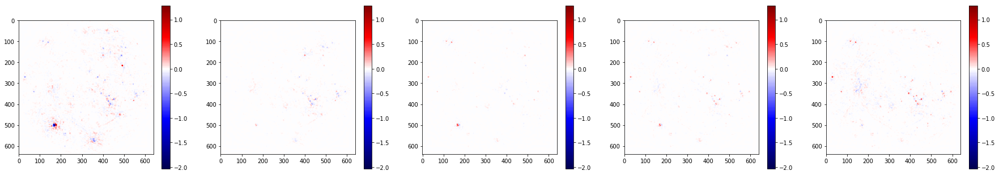

In [87]:
tmp = vis.map_scores_to_input_sz(score_rf9.sum(1).unsqueeze(1), 9)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [88]:
layer = 2
rf5_p = layer_vals[layer]
rf5, mp_idx = F.max_pool2d(rf5_p, 2, 2, return_indices = True)  # 1x64x5x5
score_rf5, score_k9 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf9, rf5, rf9, me.rf9)
vis.stats(score_rf5)

Max: 113.83822631835938, Min: -146.29376220703125, Avg: 1.1647287478473014e-05, Std:0.15557174397678317
torch.Size([5, 16, 320, 320])


(113.83822631835938,
 -146.29376220703125,
 1.1647287478473014e-05,
 0.15557174397678317)

torch.Size([5, 1, 320, 320])


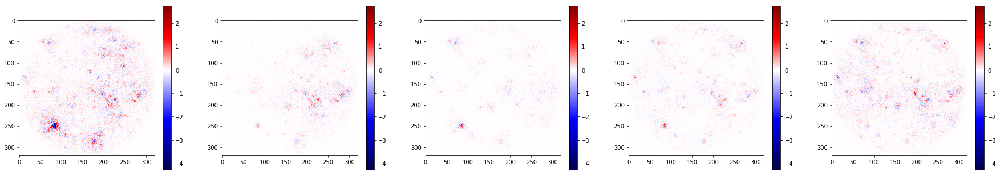

In [89]:
score_k9 = score_k9.sum(1).unsqueeze(1)
print(score_k9.size())
#vis.plot_scores(img_target, score_k9, figsize=(50,50))
vis.plot_scores(0,score_k9.sum(1).unsqueeze(0), figsize=(50,50))

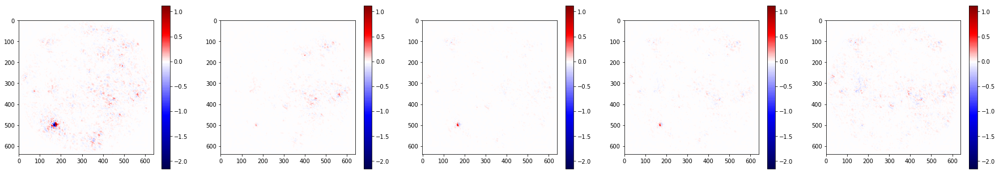

Max: 2.0563790798187256, Min: -7.680121421813965, Avg: -0.00010591800671322358, Std:0.03674478537726132
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  9.6622e-04  1.2228e-03  1.3375e-03  ...   3.6922e-03  3.1976e-03  2.4405e-03
  1.2177e-03  1.5375e-03  1.6713e-03  ...   5.1991e-03  4.3430e-03  3.1689e-03
  1.3167e-03  1.6488e-03  1.7761e-03  ...   6.4671e-03  5.2469e-03  3.7044e-03
                 ...                   ⋱                   ...                
  2.8575e-03  3.6622e-03  4.2306e-03  ...   5.6263e-03  5.5171e-03  4.5695e-03
  2.5234e-03  3.1556e-03  3.5755e-03  ...   5.2666e-03  4.9353e-03  3.9557e-03
  2.0386e-03  2.4621e-03  2.7258e-03  ...   4.1789e-03  3.7846e-03  2.9687e-03
      ⋮  

( 1 , 0 ,.,.) = 
  2.6499e-04  3.0003e-04  3.1102e-04  ...   1.2603e-03  1.0901e-03  8.2439e-04
  2.4014e-04  2.5789e-04  2.5102e-04  ...   1.7634e-03  1.4757e-03  1.0722e-03
  1.6818e-04  1.5179e-04  1.1780e-04  ...   2.1690e-03  1.7656e-03  1.2451e-03
                 ...                   ⋱                   ...                
 -4.1701e-04 -5.6143e-04 -6.6852e-04  ...   2.3672e-03  2.3314e-0

In [90]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k9, 9)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k9

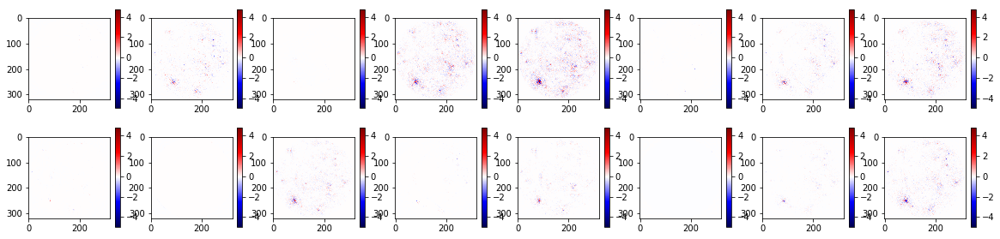

In [91]:
vis.plot_scores(img_target, score_rf5)

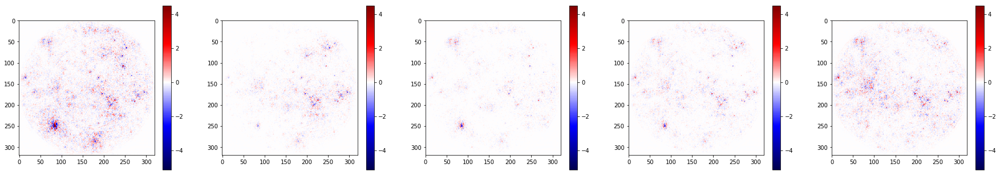

In [92]:
#vis.plot_scores(img_target,score_rf5.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf5.sum(1).unsqueeze(0), figsize=(50,50))

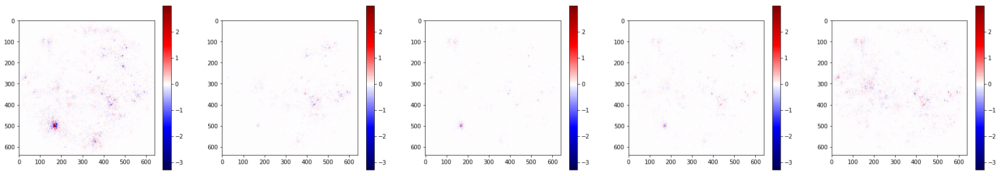

In [93]:
tmp = vis.map_scores_to_input_sz(score_rf5.sum(1).unsqueeze(1), 5)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [94]:
#del score_rf21, score_rf13, score_rf9
#del rf21, rf13, rf9
#del rf29_p, rf13_p

In [95]:
score_mp = vis.propagate_score_through_maxpool_sz2x2_st2x2(score_rf5, mp_idx)
#del score_rf29, mp_idx
layer = 1
rf3 = layer_vals[layer]
score_rf3, score_k5 = vis.propagate_score_through_conv2d_sz3_pad1(score_mp, rf3, rf5_p, me.rf5)
#del score_mp, rf4
vis.stats(score_rf3)

Max: 26.007694244384766, Min: -109.79852294921875, Avg: 3.4425979869134966e-07, Std:0.06383974925232758
torch.Size([5, 16, 640, 640])


(26.007694244384766,
 -109.79852294921875,
 3.4425979869134966e-07,
 0.06383974925232758)

torch.Size([5, 1, 640, 640])


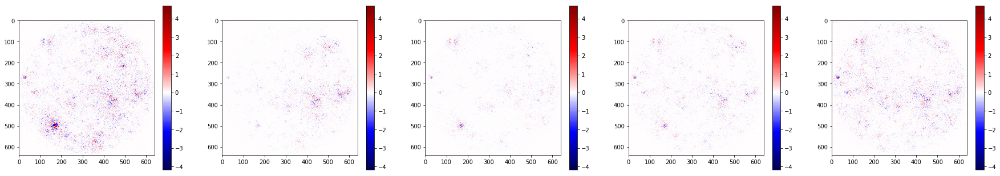

In [96]:
score_k5 = score_k5.sum(1).unsqueeze(1)
print(score_k5.size())
#vis.plot_scores(img_target, score_k5, figsize=(50,50))
vis.plot_scores(0,score_k5.sum(1).unsqueeze(0), figsize=(50,50))

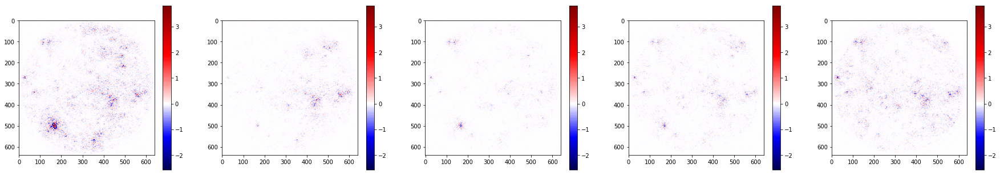

Max: 44.11140060424805, Min: -12.16321086883545, Avg: 4.1080999517524865e-05, Std:0.15175292834010756
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
 -2.4354e-03  1.3259e-03  1.8352e-03  ...   2.8854e-03  1.8272e-03  1.9070e-03
  2.6266e-03  5.1312e-03  4.1485e-03  ...   4.2896e-03  3.8679e-03  3.1096e-03
  4.0753e-03  5.0905e-03  3.6341e-03  ...   4.8823e-03  4.9781e-03  4.0058e-03
                 ...                   ⋱                   ...                
  3.7181e-03  6.3010e-03  6.3132e-03  ...   5.9503e-03  6.8410e-03  5.6982e-03
  4.3006e-03  7.7393e-03  7.3759e-03  ...   6.8868e-03  1.0089e-02  8.9931e-03
  3.7423e-03  6.0821e-03  5.8153e-03  ...   5.1387e-03  8.2432e-03  7.6501e-03
      ⋮  

( 1 , 0 ,.,.) = 
 -3.5253e-04  5.1382e-04  6.4267e-04  ...   1.0426e-03  6.7087e-04  6.6675e-04
  1.1601e-03  1.7679e-03  1.6012e-03  ...   1.5913e-03  1.4534e-03  1.1153e-03
  1.4768e-03  1.8414e-03  1.5736e-03  ...   1.7639e-03  1.8025e-03  1.3853e-03
                 ...                   ⋱                   ...                
 -6.0421e-04 -9.1000e-04 -9.1951e-04  ...   2.5559e-03  2.9150e-0

In [97]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k5, 5)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k5

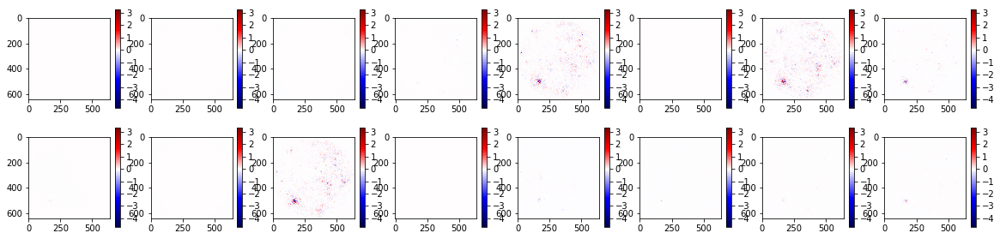

In [98]:
vis.plot_scores(img_target, score_rf3)

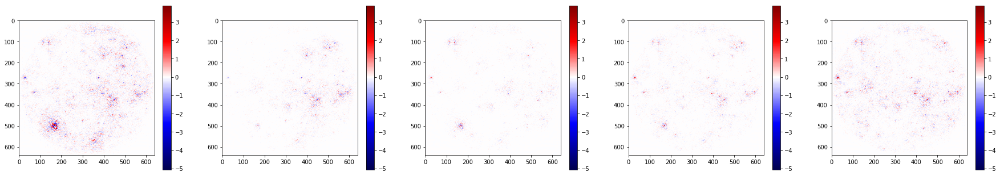

In [99]:
#vis.plot_scores(img_target,score_rf3.sum(1).unsqueeze(1), figsize=(50,50))
vis.plot_scores(0,score_rf3.sum(1).unsqueeze(0), figsize=(50,50))

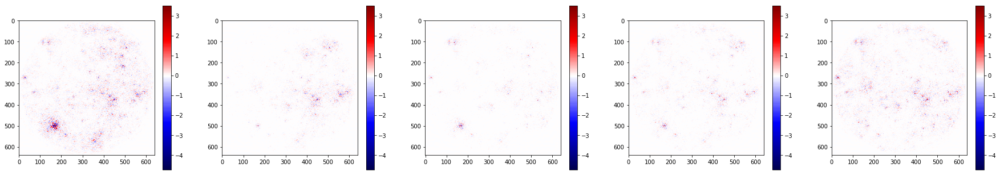

In [100]:
tmp = vis.map_scores_to_input_sz(score_rf3.sum(1).unsqueeze(1), 3)
#vis.plot_scores(img_target,tmp, figsize=(50,50))
vis.plot_scores(0,tmp.sum(1).unsqueeze(0), figsize=(50,50))
del tmp

In [101]:
#del score_rf5, score_mp
#del rf5_p

In [102]:
layer = 0
score_input, score_k3 = vis.propagate_score_through_conv2d_sz3_pad1(score_rf3, input, rf3, me.rf3)
_, _, _, std = vis.stats(score_input)

Max: 67.8798828125, Min: -58.36824035644531, Avg: 1.6174451085650687e-06, Std:0.18160277832651198
torch.Size([5, 3, 640, 640])


torch.Size([5, 1, 640, 640])


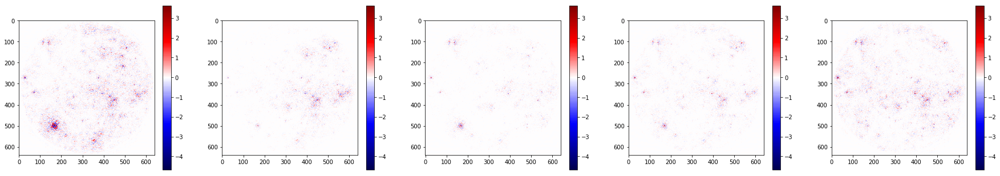

In [103]:
score_k3 = score_k3.sum(1).unsqueeze(1)
print(score_k3.size())
#vis.plot_scores(img_target, score_k3, figsize=(50,50))
vis.plot_scores(0,score_k3.sum(1).unsqueeze(0), figsize=(50,50))

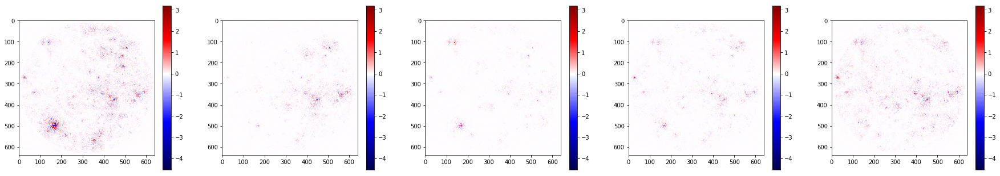

Max: 23.442638397216797, Min: -93.74502563476562, Avg: 6.558044464284735e-07, Std:0.1853618693433226
torch.Size([5, 1, 640, 640])


Variable containing:
( 0 , 0 ,.,.) = 
  1.5588e-03  3.9740e-03  3.6614e-03  ...   3.7961e-03  3.2132e-03  2.7755e-03
  5.4408e-03  6.3912e-03  6.2892e-03  ...   5.2104e-03  5.3722e-03  4.1610e-03
  3.1439e-03  3.7419e-03  6.1851e-03  ...   8.8519e-03  7.2632e-03  5.4751e-03
                 ...                   ⋱                   ...                
  1.6072e-03  4.7176e-03  5.1430e-03  ...   5.6968e-03  5.5520e-03  5.5496e-03
  2.5043e-03  6.3408e-03  6.3587e-03  ...   6.0627e-03  8.7924e-03  8.6929e-03
  3.5155e-03  6.2064e-03  6.0103e-03  ...   5.2795e-03  8.4906e-03  7.8570e-03
      ⋮  

( 1 , 0 ,.,.) = 
 -3.3500e-04  1.7047e-04 -2.0131e-04  ...   1.4010e-03  1.0524e-03  9.1298e-04
  4.4740e-04  7.6107e-04  6.7469e-04  ...   1.9363e-03  1.9052e-03  1.4466e-03
 -1.8738e-04  5.0336e-05  4.7245e-04  ...   3.0539e-03  2.4805e-03  1.8329e-03
                 ...                   ⋱                   ...                
 -5.9192e-04 -1.0771e-03 -1.2594e-03  ...   2.3093e-03  2.2854e-0

In [104]:
# map to input space
score_kmapped = vis.map_scores_to_input_sz(score_k3, 3)
#vis.plot_scores(img_target,score_kmapped, figsize=(50,50))
vis.plot_scores(0,score_kmapped.sum(1).unsqueeze(0), figsize=(50,50))
vis.stats(score_kmapped)
score_accumulated_k.add_(score_kmapped)
#del score_k3

## We can decide to sum score_accumulated_k or not!!

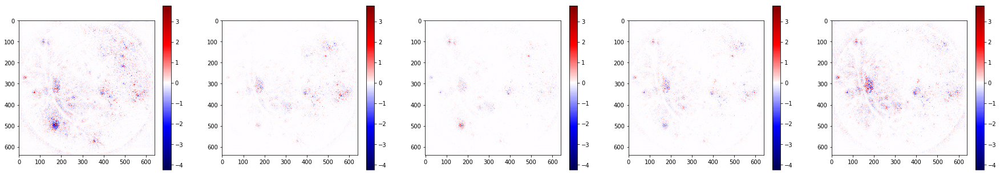

In [105]:
#vis.plot_scores(img_target,score_input.sum(1).unsqueeze(1), figsize=(50,50), only_positive=False)
vis.plot_scores(0,score_input.sum(1).unsqueeze(0), figsize=(50,50), only_positive=False)


In [106]:
print("Part of the score represented by last layer:")
si = score_input.sum(3).sum(2).sum(1)
print(si)
sa = score_accumulated_k.sum(3).sum(2).sum(1).squeeze()
print(sa)
print(si+sa+me.lc[0].bias)

Part of the score represented by last layer:
Variable containing:
  5.9151
-46.6096
-15.8035
 16.4524
 49.9831
[torch.FloatTensor of size 5]

Variable containing:
-300.9490
  15.2049
  37.4547
 -50.9240
-244.5714
[torch.FloatTensor of size 5]

Variable containing:
-295.0830
 -30.9120
  21.7021
 -34.7909
-194.4052
[torch.FloatTensor of size 5]



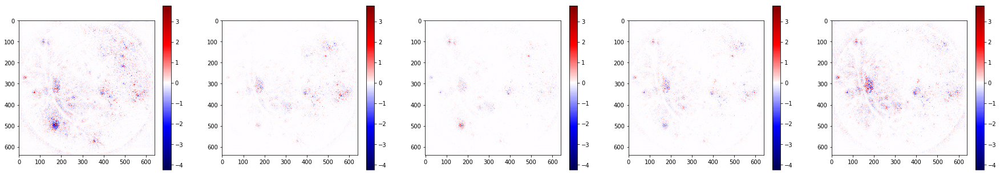

Variable containing:
  5.9151 -46.6096 -15.8035  16.4525  49.9831
[torch.FloatTensor of size 1x5]



In [107]:
vis.plot_scores(0,score_input.sum(1).unsqueeze(0), figsize=(50,50))
print(score_input.sum(1).unsqueeze(0).sum(3).sum(2))

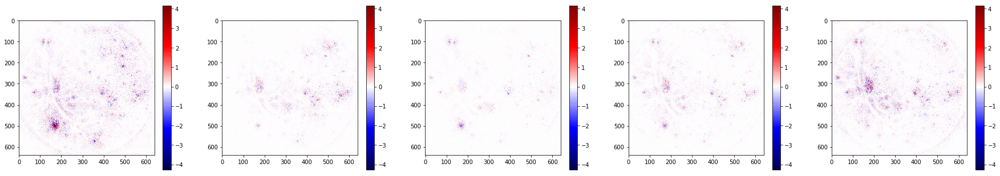

Variable containing:
-295.0829  -30.9120   21.7021  -34.7909 -194.4053
[torch.FloatTensor of size 1x5]

torch.Size([1, 5, 640, 640])


In [108]:
score_total = score_input.sum(1).unsqueeze(0) + score_accumulated_k.squeeze().unsqueeze(0)
vis.plot_scores(0, score_total, figsize=(50,50))
print(score_total.sum(3).sum(2) + me.lc[0].bias)
print(score_total.size())

In [109]:
# Test for checking that the sum of the scores is equal to the last layer score (for every target)
nclasses = 5
for t in range(nclasses):
    total_score = score_k637[t].sum() + score_k509[t].sum() + score_k381[t].sum() + score_k253[t].sum() + \
                  score_k189[t].sum() + score_k125[t].sum()+ score_k93[t].sum() + score_k61[t].sum() + \
                  score_k45[t].sum() + score_k29[t].sum() + score_k21[t].sum() + score_k13[t].sum() + \
                  score_k9[t].sum() + score_k5[t].sum() + score_k3[t].sum() + score_input[t].sum() + me.lc[0].bias[t]
    print("Class {} : {} == {} ".format(t, total_score.data[0], output[0][t].data[0]))

print("Score 637")
print(score_k637.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 509")
print(score_k509.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 381")
print(score_k381.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 253")
print(score_k253.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 189")
print(score_k189.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 125")
print(score_k125.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 93")
print(score_k93.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 61")
print(score_k61.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 45")
print(score_k45.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 29")
print(score_k29.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 21")
print(score_k21.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 13")
print(score_k13.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 9")
print(score_k9.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 5")
print(score_k5.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
print("Score 3")
print(score_k3.sum(3).sum(2).sum(1).data.unsqueeze(1).t())
   

Class 0 : -295.0830078125 == -295.0829772949219 
Class 1 : -30.912036895751953 == -30.91199493408203 
Class 2 : 21.70208168029785 == 21.702089309692383 
Class 3 : -34.79093933105469 == -34.79090118408203 
Class 4 : -194.4052734375 == -194.40524291992188 
Score 637

 326.9360   84.2731   -9.3565  -51.2489 -158.9272
[torch.FloatTensor of size 1x5]

Score 509

-420.0283 -104.0317   16.5810   29.6840   45.5727
[torch.FloatTensor of size 1x5]

Score 381

 -27.1625  -56.5001  -59.5354   48.6623  200.5818
[torch.FloatTensor of size 1x5]

Score 253

 276.8928  150.9478    3.5843 -139.6199 -390.1153
[torch.FloatTensor of size 1x5]

Score 189

-139.2568  -29.5257  -14.4226  -33.6882   59.9352
[torch.FloatTensor of size 1x5]

Score 125

-227.8238   51.3346   92.2413   64.6814   56.4347
[torch.FloatTensor of size 1x5]

Score 93

 -46.5364  -87.5043  -39.6689   23.6418  141.9384
[torch.FloatTensor of size 1x5]

Score 61

-117.3893 -100.3311  -32.4600   -9.0328  -22.1459
[torch.FloatTensor of size 1

Score distribution for predicted class: 2


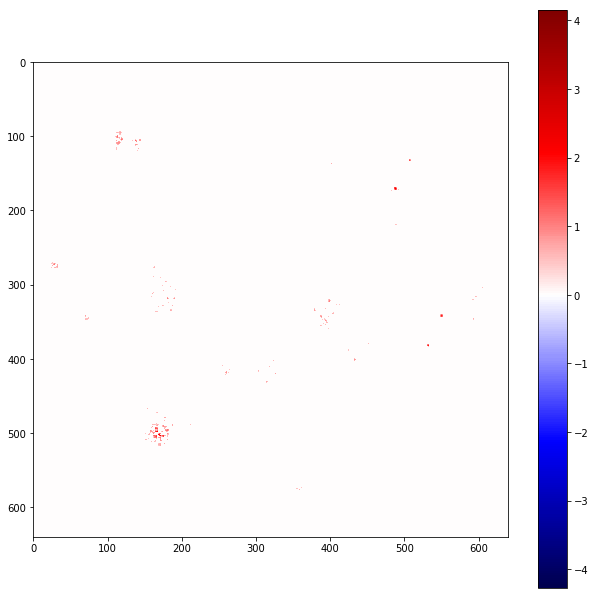

In [110]:
std = torch.std(score_total.view(-1)).data[0]
pc = pred_class.data[0]
print("Score distribution for predicted class: {}".format(pc))
vis.plot_scores(pc,score_total.squeeze().unsqueeze(1), figsize=(100,100), only_positive=True, threshold=2.0*std)

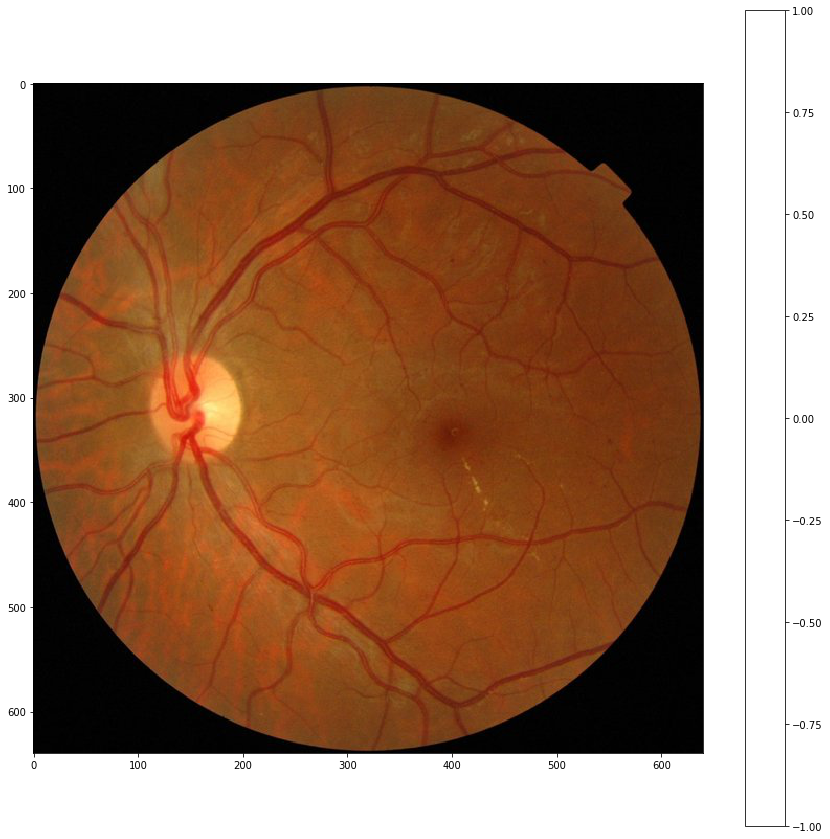

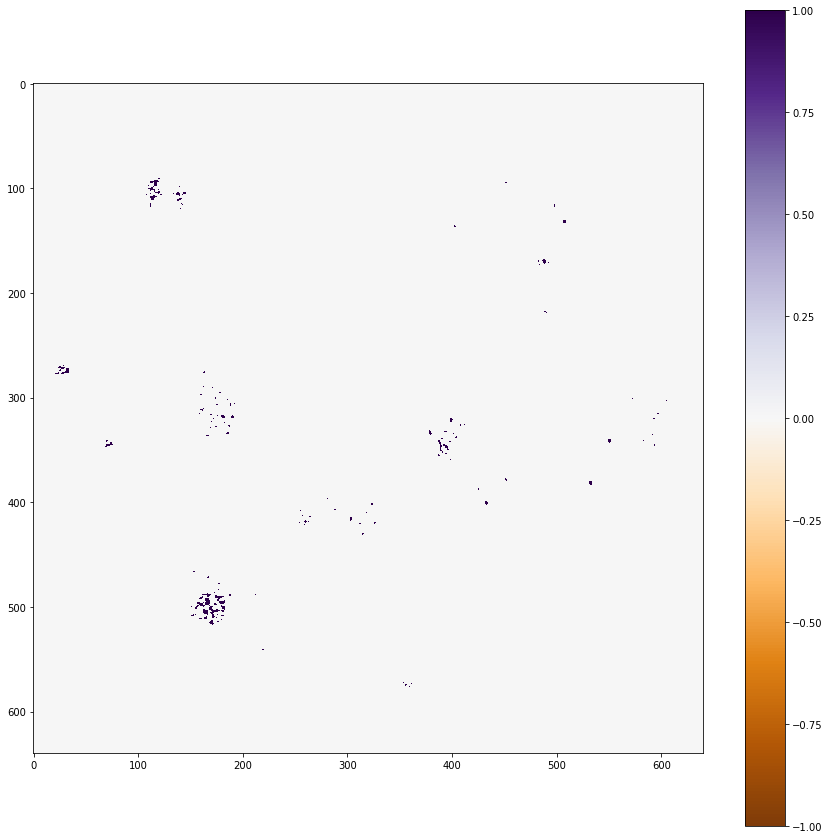

In [111]:
vis.plot_final(score_total.squeeze()[pc], path, only_positive=True, threshold=2*std, cmap=matplotlib.cm.PuOr, binary=True)

In [112]:
from IPython.display import Image
base = os.path.splitext(os.path.basename(path))[0]
command_img_animated = base + ".animated.gif"
Image(url=command_img_animated)